## Importing necessary libraries

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import GridSearchCV

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [2]:
## Suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
## Set display limits
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

## Loading and Understanding the Dataset

In [4]:
# reading the input file

housing = pd.read_csv("/Users/komal/Documents/Advanced Logistic Regression/train.csv")

housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
#Check all columns
housing.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
  

In [6]:
#Check shape of dataframe
housing.shape

(1460, 81)

In [7]:
#Get some information about the data
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
#get model description of dataframe
housing.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
# count the number of null values present in the data

round(housing.isnull().sum()/len(housing.index)*100,2)


Id                0.00
MSSubClass        0.00
MSZoning          0.00
LotFrontage      17.74
LotArea           0.00
Street            0.00
Alley            93.77
LotShape          0.00
LandContour       0.00
Utilities         0.00
LotConfig         0.00
LandSlope         0.00
Neighborhood      0.00
Condition1        0.00
Condition2        0.00
BldgType          0.00
HouseStyle        0.00
OverallQual       0.00
OverallCond       0.00
YearBuilt         0.00
YearRemodAdd      0.00
RoofStyle         0.00
RoofMatl          0.00
Exterior1st       0.00
Exterior2nd       0.00
MasVnrType        0.55
MasVnrArea        0.55
ExterQual         0.00
ExterCond         0.00
Foundation        0.00
BsmtQual          2.53
BsmtCond          2.53
BsmtExposure      2.60
BsmtFinType1      2.53
BsmtFinSF1        0.00
BsmtFinType2      2.60
BsmtFinSF2        0.00
BsmtUnfSF         0.00
TotalBsmtSF       0.00
Heating           0.00
HeatingQC         0.00
CentralAir        0.00
Electrical        0.07
1stFlrSF   

## Certain columns have greater than 80% missing values so we will be removing them
- Alley
- PoolQC 
- Fence
- MiscFeature

In [10]:
housing.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1,inplace = True)

housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [11]:
# count the number of null values present in the data
housing.isnull().sum()[housing.isnull().sum()>0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     690
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [12]:
#replace Nan values of FireplaceQu with NA i.e. No Fireplace 
housing.FireplaceQu = housing.FireplaceQu.fillna('NA')

In [13]:
#check missing values again
housing.isnull().sum()[housing.isnull().sum()>0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [14]:
#check unique values of LotFrontage
housing.LotFrontage.value_counts()

60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
64.0      19
24.0      19
73.0      18
55.0      17
63.0      17
79.0      17
72.0      17
100.0     16
66.0      15
74.0      15
51.0      15
52.0      14
59.0      13
82.0      12
71.0      12
67.0      12
43.0      12
40.0      12
57.0      12
76.0      11
69.0      11
92.0      10
34.0      10
53.0      10
86.0      10
88.0      10
84.0       9
35.0       9
62.0       9
44.0       9
77.0       9
93.0       8
98.0       8
96.0       8
61.0       8
95.0       7
58.0       7
120.0      7
107.0      7
94.0       6
81.0       6
36.0       6
30.0       6
48.0       6
91.0       6
41.0       6
54.0       6
89.0       6
110.0      6
105.0      6
32.0       5
47.0       5
87.0       5
56.0       5
37.0       5
83.0       5
102.0      4
42.0       4
49.0       4
104.0      3
103.0      3
99.0       3
45.0       3
108.0      3
130.0      3
124.0      2

In [15]:
#check median of LotFrontage
LotFrontage_median = housing.LotFrontage.median()
LotFrontage_median

69.0

In [16]:
#impute missing values of LotFrontage with median due to some outliers in data shown from Descibe section
housing.LotFrontage = housing.LotFrontage.fillna(LotFrontage_median)

In [17]:
#impute missing values of MasVnrArea with median due to some outliers in data shown from Descibe section
housing.MasVnrArea = housing.MasVnrArea.fillna(housing.MasVnrArea.median())    

In [18]:
#replace Nan values of MasVnrArea with None i.e. No Masonary type
housing.MasVnrType = housing.MasVnrType.fillna('None')

In [19]:
#replace Nan values of BsmtQual with NA i.e. No Basement
housing.BsmtQual = housing.BsmtQual.fillna('NA')

In [20]:
#replace Nan values of BsmtCond with NA i.e. No Basement
housing.BsmtCond = housing.BsmtCond.fillna('NA')

In [21]:
#replace Nan values of BsmtExposure with No i.e. No Exposure
housing.BsmtExposure = housing.BsmtExposure.fillna('No')

In [22]:
#replace Nan values of BsmtFinType1 with NA i.e. No Basement
housing.BsmtFinType1 = housing.BsmtFinType1.fillna('NA')

In [23]:
#replace Nan values of BsmtFinType2 with NA i.e. No Basement
housing.BsmtFinType2 = housing.BsmtFinType2.fillna('NA')

In [24]:
#impute missing values of Electrical with mode due to categorical column
housing.Electrical = housing.Electrical.fillna(housing.Electrical.mode()[0])    

In [25]:
#replace Nan values of GarageType with NA i.e. No Garage
housing.GarageType = housing.GarageType.fillna('NA')

In [26]:
#replace Nan values of GarageYrBlt with 0 i.e. No Garage
housing.GarageYrBlt = housing.GarageYrBlt.fillna(0)

In [27]:
#replace Nan values of GarageFinish with NA i.e. No Garage
housing.GarageFinish = housing.GarageFinish.fillna('NA')


In [28]:
#replace Nan values of GarageQual with NA i.e. No Garage
housing.GarageQual = housing.GarageQual.fillna('NA')

In [29]:
#replace Nan values of GarageCond with NA i.e. No Garage
housing.GarageCond = housing.GarageCond.fillna('NA')

In [30]:
#check missing values again
housing.isnull().sum()[housing.isnull().sum()>0]

Series([], dtype: int64)

In [31]:
#calculate the age of house i.e. HouseAge from YrSold - YearBuilt 
housing['HouseAge'] = housing.YrSold - housing.YearBuilt

In [32]:
#Drop YrSold, YearBuilt after HouseAge
housing=housing.drop(columns=['YrSold', 'YearBuilt'])

In [33]:
#convert MSSubClass into object type 
convert_dict = {'MSSubClass':object}
housing = housing.astype(convert_dict)

In [34]:
#convert ExterQual 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
housing = housing.replace({'ExterQual':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [35]:
#convert BsmtQual 0,1,2,3,4,5 -> NA, Po, Fa, TA, Gd, Ex
housing = housing.replace({'BsmtQual':{'NA':0,'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [36]:
#convert BsmtExposure 0,1,2,3,4 -> NA, No, Mn, Av, gd
housing = housing.replace({'BsmtExposure':{'NA':0, 'No':1,'Mn':2, 'Av':3, 'Gd':4}})

In [37]:
#convert BsmtFinType1 0,1,2,3,4,5,6 -> NA, Unf, LwQ, Rec, BLQ, ALQ, GLQ
housing = housing.replace({'BsmtFinType1':{'NA':0,'Unf':1,'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}})

In [38]:
#convert HeatingQC 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
housing = housing.replace({'HeatingQC':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})


In [39]:
#convert KitchenQual 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
housing = housing.replace({'KitchenQual':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})


In [40]:
#convert FireplaceQu 0,1,2,3,4,5 -> NA, Po, Fa, TA, Gd, Ex
housing = housing.replace({'FireplaceQu':{'NA':0,'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [41]:
housing.ExterQual.value_counts()

3    906
4    488
5     52
2     14
Name: ExterQual, dtype: int64

In [42]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearRemo

In [43]:
for c in housing.columns:
    if housing[c].dtype == object :
        print(c)
        print(housing[c].value_counts(normalize=True))


MSSubClass
20     0.367123
60     0.204795
50     0.098630
120    0.059589
30     0.047260
160    0.043151
70     0.041096
80     0.039726
90     0.035616
190    0.020548
85     0.013699
75     0.010959
45     0.008219
180    0.006849
40     0.002740
Name: MSSubClass, dtype: float64
MSZoning
RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
Street
Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
LotShape
Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
LandContour
Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
Utilities
AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
LotConfig
Inside     0.720548
Corner     0.180137
CulDSac    0.064384
FR2        0.032192
FR3        0.002740
Name: LotConfig, dtype: float64
LandSlope
Gtl    0.946575
Mod    0.044521
Sev    0.008904
Name: LandSlop

In [44]:
#Drop columns which have more than 80% bias data
housing = housing.drop(columns=['Id','Street', 'LandContour', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'BsmtCond'
                                    ,'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageQual', 'GarageCond'
                                    , 'PavedDrive', 'Condition1', 'BldgType', 'ExterCond', 'BsmtFinType2', 'SaleType'
                                    , 'SaleCondition'])

In [45]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LotConfig      1460 non-null   object 
 6   Neighborhood   1460 non-null   object 
 7   HouseStyle     1460 non-null   object 
 8   OverallQual    1460 non-null   int64  
 9   OverallCond    1460 non-null   int64  
 10  YearRemodAdd   1460 non-null   int64  
 11  RoofStyle      1460 non-null   object 
 12  Exterior1st    1460 non-null   object 
 13  Exterior2nd    1460 non-null   object 
 14  MasVnrType     1460 non-null   object 
 15  MasVnrArea     1460 non-null   float64
 16  ExterQual      1460 non-null   int64  
 17  Foundation     1460 non-null   object 
 18  BsmtQual

In [46]:
#Get all object type columns
object_columns = []
for c in housing.columns:
    if housing[c].dtype == object:
        object_columns.append(c)
print(object_columns)

['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'GarageType', 'GarageFinish']


### Create Dummy Variables

In [47]:
#create dummy variable for MSSubClass
MSSubClass_df = pd.get_dummies(housing['MSSubClass'],drop_first=True, prefix='MSSubClass')
#concat MSSubClass_df with main housing data
housing = pd.concat([housing,MSSubClass_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [48]:
#create dummy variable for MSZoning
MSZoning_df = pd.get_dummies(housing['MSZoning'],drop_first=True, prefix='MSZoning')
MSZoning_df.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,0,0,1,0
4,0,0,1,0


In [49]:
#concat MSZoning_df with main housing data
housing = pd.concat([housing,MSZoning_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [50]:
#create dummy variable for LotShape
LotShape_df = pd.get_dummies(housing['LotShape'],drop_first=True, prefix='LotShape')

In [51]:
#concat LotShape_df with main housing data
housing = pd.concat([housing,LotShape_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [52]:
#create dummy variable for LotConfig
LotConfig_df = pd.get_dummies(housing['LotConfig'],drop_first=True, prefix='LotConfig')
#concat LotConfig_df with main housing data
housing = pd.concat([housing,LotConfig_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


In [53]:
#create dummy variable for Neighborhood
Neighborhood_df = pd.get_dummies(housing['Neighborhood'],drop_first=True, prefix='Neighborhood')
#concat Neighborhood_df with main housing data
housing = pd.concat([housing,Neighborhood_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [54]:
#create dummy variable for HouseStyle
HouseStyle_df = pd.get_dummies(housing['HouseStyle'],drop_first=True, prefix='HouseStyle')
#concat HouseStyle_df with main housing data
housing = pd.concat([housing,HouseStyle_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [55]:
#create dummy variable for RoofStyle
RoofStyle_df = pd.get_dummies(housing['RoofStyle'],drop_first=True, prefix='RoofStyle')
#concat RoofStyle_df with main housing data
housing = pd.concat([housing,RoofStyle_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [56]:
#create dummy variable for Exterior1st
Exterior1st_df = pd.get_dummies(housing['Exterior1st'],drop_first=True, prefix='Exterior1st')
#concat Exterior1st_df with main housing data 
housing = pd.concat([housing,Exterior1st_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [57]:
#create dummy variable for Exterior2nd
Exterior2nd_df = pd.get_dummies(housing['Exterior2nd'],drop_first=True, prefix='Exterior2nd')
#concat Exterior2nd_df with main housing data 
housing = pd.concat([housing ,Exterior2nd_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0

In [58]:
#create dummy variable for MasVnrType
MasVnrType_df = pd.get_dummies(housing['MasVnrType'],drop_first=True, prefix='MasVnrType')
#concat MasVnrType_df with main housing data 
housing = pd.concat([housing,MasVnrType_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.

In [59]:
#create dummy variable for Foundation
Foundation_df = pd.get_dummies(housing['Foundation'],drop_first=True, prefix='Foundation')
#concat Foundation_df with main housing data
housing = pd.concat([housing ,Foundation_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8

In [60]:
#create dummy variable for GarageType
GarageType_df = pd.get_dummies(housing['GarageType'],drop_first=True, prefix='GarageType')
#concat GarageType_df with main housing data
housing = pd.concat([housing ,GarageType_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [61]:
#create dummy variable for GarageFinish
GarageFinish_df = pd.get_dummies(housing['GarageFinish'],drop_first=True, prefix='GarageFinish')
#concat GarageFinish_df with main housing data
housing = pd.concat([housing ,GarageFinish_df],axis=1)
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,

In [62]:
housing.shape

(1460, 162)

In [63]:
#Drop categorical variables after ceating dummy varaibles
housing=housing.drop(columns=['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle'
                                    , 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
                                    'GarageType', 'GarageFinish'])

In [64]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 149 entries, LotFrontage to GarageFinish_Unf
dtypes: float64(3), int64(39), uint8(107)
memory usage: 631.7 KB


## Checking the correlation between numerical columns

In [65]:
#Correlation map to see how features are correlated with SalePrice
plt.figure(figsize=(100,100))
sns.heatmap(housing.corr(), annot =True, cmap="YlGnBu") 
plt.show()

## Preparing Data For Modeling

In [66]:
df_train,df_test = train_test_split(housing,train_size=0.70,random_state=100)
print(df_train.shape)
print(df_test.shape)

(1021, 149)
(439, 149)


In [67]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,102

## Rescaling Numeric Features

In [68]:
#instantiate the object
scaler = StandardScaler()

#create list of numeric variables
num_vars = ['LotFrontage','LotArea','OverallQual','OverallCond','YearRemodAdd','MasVnrArea', 'ExterQual', 'BsmtQual'
            , 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'TotalBsmtSF'
           , 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath'
            , 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces'
           , 'FireplaceQu', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch'
           , '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'HouseAge']

#fit on data
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
318,0.925326,-0.057261,0.648310,-0.532073,0.389207,0.809137,1.051361,0.577925,2.181065,1.138412,1.159065,-0.293313,-0.454262,0.621091,0.871757,0.511410,2.137583,-0.124502,2.121655,1.066863,-0.247791,0.784821,1.244440,1.395790,-0.234155,0.741868,1.555150,0.622148,0.658513,0.274068,1.646935,0.867501,1.988123,0.195951,1.912645,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,260000,-0.675791,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
239,-0.795709,-0.169753,-0.066511,-1.448170,-1.698692,-0.558025,-0.699764,-0.533302,-0.653302,-0.753845,-0.761831,-0.293313,0.172244,-0.712611,-1.181447,-0.931882,0.793638,-0.124502,-0.058599,-0.837450,-0.247791,-1.028080,1.244440,0.175669,-0.234155,-0.776063,0.308833,0.622148,1.206469,0.177351,-1.034916,-1.188045,-0.744598,1.405086,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,113000,0.939707,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
986,-0.478677,-0.502762,-0.066511,2.216221,0.874765,-0.558025,-0.699764,-0.533302,-0.653302,-1.226909,-0.964030,-0.293313,-0.175567,-1.257424,-0.154845,-0.421449,0.667284,-0.124502,0.219811,-0.837450,-0.247791,-1.028080,-0.753316,-1.044452,-0.234155,0.741868,-0.937484,-0.927153,-0.985354,0.179549,-1.034916,-1.023035,2.422143,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.10

In [69]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,

## Train the Model

In [70]:
#create X_train,y_train 
#cnt is out Target/dependent Variable
y_train = df_train.pop('SalePrice')
X_train = df_train

In [71]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1',
       ...
       'Foundation_Wood', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_NA', 'GarageFinish_NA', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=148)

## RFE - Recursive Feature Elimination

Lets take top 35 features from RFE

In [72]:
#Running RFE with the out variables equals to 35
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select = 35)
rfe = rfe.fit(X_train,y_train)

In [73]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 70),
 ('LotArea', False, 61),
 ('OverallQual', True, 1),
 ('OverallCond', False, 63),
 ('YearRemodAdd', False, 108),
 ('MasVnrArea', False, 71),
 ('ExterQual', False, 69),
 ('BsmtQual', False, 47),
 ('BsmtExposure', False, 15),
 ('BsmtFinType1', False, 72),
 ('BsmtFinSF1', False, 6),
 ('BsmtFinSF2', False, 9),
 ('BsmtUnfSF', False, 3),
 ('TotalBsmtSF', False, 2),
 ('HeatingQC', False, 110),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('LowQualFinSF', False, 8),
 ('GrLivArea', False, 7),
 ('BsmtFullBath', False, 65),
 ('BsmtHalfBath', False, 91),
 ('FullBath', False, 82),
 ('HalfBath', False, 85),
 ('BedroomAbvGr', False, 78),
 ('KitchenAbvGr', False, 75),
 ('KitchenQual', False, 44),
 ('TotRmsAbvGrd', False, 77),
 ('Fireplaces', False, 98),
 ('FireplaceQu', False, 81),
 ('GarageYrBlt', False, 109),
 ('GarageCars', False, 40),
 ('GarageArea', False, 93),
 ('WoodDeckSF', False, 97),
 ('OpenPorchSF', False, 107),
 ('EnclosedPorch', False, 102),
 ('3SsnPorch', 

In [74]:
#selected columns from rfe
col = X_train.columns[rfe.support_]
col

Index(['OverallQual', '1stFlrSF', '2ndFlrSF', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_190', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR3', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CmentBd', 'Exterior2nd_ImStucc', 'Exterior2nd_Stone', 'Exterior2nd_VinylSd'], dtype='object')

In [75]:
#skipped columns from rfe
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'LotArea', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       ...
       'Foundation_Wood', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_NA', 'GarageFinish_NA', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=113)

## Building model using statsmodel

In [76]:
#ceatinf X_train with RFE selected columns
X_train_rfe = X_train[col]

In [77]:
#adding a constant variable
X_train_rfe = sm.add_constant(X_train_rfe)

In [78]:
#create a RFE model
lm = sm.OLS(y_train,X_train_rfe).fit()  #Running the linear Model

In [79]:
#Get the Summary of Linear Model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     122.4
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:29   Log-Likelihood:                -12120.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     986   BIC:                         2.448e+04
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.412e+05   1.38e+04     10.260      0.000    1.14e+05    1.68e+05
OverallQual           2.895e+04   1818.791     15.916      0.000    2.54e+04    3.25e+04
1stFlrSF               2.71e+04   1631.839     16.608      0.000    2.39e+04    3.03e+04
2ndFlrSF              2.333e+04   1994.549     11.695      0.000    1.94e+04    2.72e+04
MSSubClass_90        -2.259e+04   6029.456     -3.747      0.000   -3.44e+04   -1.08e+04
MSSubClass_120       -1.817e+04   5174.700     -3.512      0.000   -2.83e+04   -8017.243
MSSubClass_160       -2.911e+04   6425.523     -4.530      0.000   -4.17e+04   -1.65e+04
MSSubClass_190       -1.087e+04   7399.392     -1.469      0.142   -2.54e+04    3649.572
MSZoning_FV           2.157e+04   1.74e+04      1.236      0.217   -1.27e+04    5.58e+04
MSZoning_RH           1.374e+04   1.68e+04      0.819      0.413   -1.92e+04    4.67e+04
MSZoning_RL           2.442e+04   1.37e+04      1.785      0.075   -2433.037    5.13e+04
MSZoning_RM           1.236e+04   1.38e+04      0.894      0.372   -1.48e+04    3.95e+04
LotShape_IR3         -1.938e+04    1.2e+04     -1.610      0.108    -4.3e+04    4244.605
LotConfig_CulDSac     1.736e+04   4649.392      3.734      0.000    8236.594    2.65e+04
Neighborhood_Crawfor  2.814e+04   6587.418      4.272      0.000    1.52e+04    4.11e+04
Neighborhood_NoRidge  6.163e+04   6910.487      8.918      0.000    4.81e+04    7.52e+04
Neighborhood_NridgHt   5.88e+04   5551.688     10.591      0.000    4.79e+04    6.97e+04
Neighborhood_Somerst  2.834e+04   9623.383      2.945      0.003    9454.388    4.72e+04
Neighborhood_StoneBr  3.639e+04   1.06e+04      3.419      0.001    1.55e+04    5.73e+04
Neighborhood_Veenker  4.084e+04   1.11e+04      3.670      0.000     1.9e+04    6.27e+04
HouseStyle_1Story     1.319e+04   3935.034      3.353      0.001    5471.180    2.09e+04
HouseStyle_2.5Fin    -2.394e+04   1.83e+04     -1.312      0.190   -5.98e+04    1.19e+04
HouseStyle_2.5Unf    -2.455e+04    1.3e+04     -1.887      0.060   -5.01e+04     986.918
Exterior1st_AsphShn  -2.448e+04   1.78e+04     -1.372      0.170   -5.95e+04    1.05e+04
Exterior1st_BrkComm  -6.652e+04   3.28e+04     -2.026      0.043   -1.31e+05   -2084.452
Exterior1st_CemntBd  -4.868e+04   2.55e+04     -1.908      0.057   -9.88e+04    1387.856
Exterior1st_ImStucc  -7.425e+04   3.82e+04     -1.945      0.052   -1.49e+05     669.030
Exterior1st_Stone    -3.095e+04    2.8e+04     -1.105      0.270   -8.59e+04     2.4e+04
Exterior1st_Stucco   -2.908e+04   8367.129     -3.476      0.001   -4.55e+04   -1.27e+04
Exterior2nd_AsphShn  -2.448e+04   1.78e+04     -1.372      0.170   -5.95e+04    1.05e+04
Exterior2nd_Brk Cmn   2.441e+04   2.13e+04      1.146      0.252   -1.74e+04    6.62e+04
Exterior2nd_BrkFace    1.76e+04   9276.571      1.897    

In [80]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
23,Exterior1st_AsphShn,inf
29,Exterior2nd_AsphShn,inf
0,const,156.04
10,MSZoning_RL,25.98
11,MSZoning_RM,20.16
32,Exterior2nd_CmentBd,18.75
25,Exterior1st_CemntBd,18.73
8,MSZoning_FV,10.56
17,Neighborhood_Somerst,4.22
3,2ndFlrSF,3.28


MSZoning_RH has hgher p value lets drop it.

In [81]:
X_train_new = X_train_rfe.drop(['MSZoning_RH'],axis=1)

In [82]:
X_train_new.columns

Index(['const', 'OverallQual', '1stFlrSF', '2ndFlrSF', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_190', 'MSZoning_FV', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR3', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_1Story', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CmentBd', 'Exterior2nd_ImStucc', 'Exterior2nd_Stone', 'Exterior2nd_VinylSd'], dtype='object')

In [83]:
# Lets rebuild the model
X_train_lm = sm.add_constant(X_train_new)

In [84]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()


In [85]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     126.2
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:29   Log-Likelihood:                -12120.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     987   BIC:                         2.448e+04
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.502e+05   8370.588     17.939      0.000    1.34e+05    1.67e+05
OverallQual           2.906e+04   1813.330     16.026      0.000    2.55e+04    3.26e+04
1stFlrSF              2.708e+04   1631.424     16.601      0.000    2.39e+04    3.03e+04
2ndFlrSF              2.334e+04   1994.104     11.706      0.000    1.94e+04    2.73e+04
MSSubClass_90        -2.225e+04   6014.168     -3.700      0.000   -3.41e+04   -1.05e+04
MSSubClass_120       -1.803e+04   5170.963     -3.487      0.001   -2.82e+04   -7883.446
MSSubClass_160       -2.909e+04   6424.425     -4.529      0.000   -4.17e+04   -1.65e+04
MSSubClass_190       -1.078e+04   7397.258     -1.457      0.145   -2.53e+04    3739.741
MSZoning_FV            1.26e+04   1.36e+04      0.928      0.354    -1.4e+04    3.92e+04
MSZoning_RL           1.545e+04   8203.837      1.884      0.060    -645.657    3.16e+04
MSZoning_RM           3453.9848   8529.467      0.405      0.686   -1.33e+04    2.02e+04
LotShape_IR3         -1.941e+04    1.2e+04     -1.612      0.107    -4.3e+04    4215.696
LotConfig_CulDSac     1.736e+04   4648.610      3.733      0.000    8232.794    2.65e+04
Neighborhood_Crawfor  2.826e+04   6584.872      4.291      0.000    1.53e+04    4.12e+04
Neighborhood_NoRidge  6.148e+04   6907.091      8.902      0.000    4.79e+04     7.5e+04
Neighborhood_NridgHt  5.861e+04   5545.872     10.567      0.000    4.77e+04    6.95e+04
Neighborhood_Somerst  2.824e+04   9620.987      2.935      0.003    9358.244    4.71e+04
Neighborhood_StoneBr  3.616e+04   1.06e+04      3.399      0.001    1.53e+04     5.7e+04
Neighborhood_Veenker  4.077e+04   1.11e+04      3.665      0.000    1.89e+04    6.26e+04
HouseStyle_1Story     1.323e+04   3934.146      3.362      0.001    5507.839    2.09e+04
HouseStyle_2.5Fin    -2.277e+04   1.82e+04     -1.252      0.211   -5.85e+04    1.29e+04
HouseStyle_2.5Unf     -2.58e+04   1.29e+04     -1.996      0.046   -5.12e+04    -434.581
Exterior1st_AsphShn   -2.46e+04   1.78e+04     -1.379      0.168   -5.96e+04    1.04e+04
Exterior1st_BrkComm  -6.634e+04   3.28e+04     -2.021      0.044   -1.31e+05   -1920.773
Exterior1st_CemntBd   -4.86e+04   2.55e+04     -1.905      0.057   -9.87e+04    1460.069
Exterior1st_ImStucc  -7.418e+04   3.82e+04     -1.943      0.052   -1.49e+05     730.071
Exterior1st_Stone    -3.099e+04    2.8e+04     -1.106      0.269    -8.6e+04     2.4e+04
Exterior1st_Stucco   -2.914e+04   8365.455     -3.483      0.001   -4.56e+04   -1.27e+04
Exterior2nd_AsphShn   -2.46e+04   1.78e+04     -1.379      0.168   -5.96e+04    1.04e+04
Exterior2nd_Brk Cmn   2.439e+04   2.13e+04      1.145      0.252   -1.74e+04    6.62e+04
Exterior2nd_BrkFace   1.757e+04   9274.930      1.894      0.059    -635.159    3.58e+04
Exterior2nd_CmentBd   6.838e+04   2.55e+04      2.679    

MSZoning_RM has higher p value , Lets drop it 

In [86]:
X_train_new = X_train_new.drop(['MSZoning_RM'],axis=1)

In [87]:
# Let's rebuild the model
X_train_lm = sm.add_constant(X_train_new)

In [88]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()


In [89]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     130.2
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:29   Log-Likelihood:                -12120.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     988   BIC:                         2.447e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.532e+05   3596.012     42.608      0.000    1.46e+05     1.6e+05
OverallQual           2.911e+04   1808.405     16.097      0.000    2.56e+04    3.27e+04
1stFlrSF              2.706e+04   1629.642     16.604      0.000    2.39e+04    3.03e+04
2ndFlrSF              2.331e+04   1991.582     11.705      0.000    1.94e+04    2.72e+04
MSSubClass_90        -2.231e+04   6010.124     -3.712      0.000   -3.41e+04   -1.05e+04
MSSubClass_120       -1.804e+04   5168.762     -3.489      0.001   -2.82e+04   -7892.385
MSSubClass_160       -2.889e+04   6402.614     -4.513      0.000   -4.15e+04   -1.63e+04
MSSubClass_190       -1.093e+04   7383.973     -1.481      0.139   -2.54e+04    3556.717
MSZoning_FV           9504.3222   1.12e+04      0.847      0.397   -1.25e+04    3.15e+04
MSZoning_RL           1.242e+04   3367.027      3.690      0.000    5816.793     1.9e+04
LotShape_IR3         -1.938e+04    1.2e+04     -1.610      0.108    -4.3e+04    4234.235
LotConfig_CulDSac     1.735e+04   4646.609      3.733      0.000    8229.495    2.65e+04
Neighborhood_Crawfor  2.819e+04   6579.847      4.284      0.000    1.53e+04    4.11e+04
Neighborhood_NoRidge  6.146e+04   6903.815      8.902      0.000    4.79e+04     7.5e+04
Neighborhood_NridgHt  5.853e+04   5540.306     10.564      0.000    4.77e+04    6.94e+04
Neighborhood_Somerst  2.815e+04   9614.436      2.928      0.003    9282.659     4.7e+04
Neighborhood_StoneBr  3.605e+04   1.06e+04      3.391      0.001    1.52e+04    5.69e+04
Neighborhood_Veenker  4.074e+04   1.11e+04      3.664      0.000    1.89e+04    6.26e+04
HouseStyle_1Story     1.318e+04   3930.365      3.352      0.001    5463.013    2.09e+04
HouseStyle_2.5Fin    -2.336e+04   1.81e+04     -1.289      0.198   -5.89e+04    1.22e+04
HouseStyle_2.5Unf    -2.585e+04   1.29e+04     -2.001      0.046   -5.12e+04    -499.029
Exterior1st_AsphShn  -2.454e+04   1.78e+04     -1.376      0.169   -5.95e+04    1.05e+04
Exterior1st_BrkComm  -6.605e+04   3.28e+04     -2.013      0.044    -1.3e+05   -1669.212
Exterior1st_CemntBd  -4.838e+04   2.55e+04     -1.898      0.058   -9.84e+04    1651.108
Exterior1st_ImStucc  -7.424e+04   3.82e+04     -1.946      0.052   -1.49e+05     640.244
Exterior1st_Stone    -3.095e+04    2.8e+04     -1.105      0.269   -8.59e+04     2.4e+04
Exterior1st_Stucco   -2.899e+04   8353.597     -3.470      0.001   -4.54e+04   -1.26e+04
Exterior2nd_AsphShn  -2.454e+04   1.78e+04     -1.376      0.169   -5.95e+04    1.05e+04
Exterior2nd_Brk Cmn   2.416e+04   2.13e+04      1.135      0.256   -1.76e+04    6.59e+04
Exterior2nd_BrkFace   1.762e+04   9270.067      1.901      0.058    -572.146    3.58e+04
Exterior2nd_CmentBd   6.834e+04   2.55e+04      2.679      0.008    1.83e+04    1.18e+05
Exterior2nd_ImStucc   4.369e+04   1.35e+04      3.242    

MSZoning_FV has high p value , lets drop it

In [90]:
X_train_new = X_train_new.drop(['MSZoning_FV'],axis=1)

In [91]:
# Rebuild the model
X_train_lm = sm.add_constant(X_train_new)


In [92]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [93]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     134.4
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:29   Log-Likelihood:                -12121.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     989   BIC:                         2.446e+04
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.537e+05   3542.413     43.400      0.000    1.47e+05    1.61e+05
OverallQual           2.912e+04   1808.124     16.104      0.000    2.56e+04    3.27e+04
1stFlrSF              2.703e+04   1628.988     16.592      0.000    2.38e+04    3.02e+04
2ndFlrSF              2.341e+04   1987.668     11.779      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.232e+04   6009.255     -3.714      0.000   -3.41e+04   -1.05e+04
MSSubClass_120        -1.79e+04   5165.697     -3.466      0.001    -2.8e+04   -7766.989
MSSubClass_160       -2.818e+04   6346.214     -4.440      0.000   -4.06e+04   -1.57e+04
MSSubClass_190       -1.115e+04   7378.608     -1.511      0.131   -2.56e+04    3332.400
MSZoning_RL           1.182e+04   3289.044      3.592      0.000    5361.252    1.83e+04
LotShape_IR3         -1.923e+04    1.2e+04     -1.599      0.110   -4.28e+04    4376.897
LotConfig_CulDSac     1.706e+04   4633.497      3.682      0.000    7967.239    2.62e+04
Neighborhood_Crawfor  2.825e+04   6578.520      4.294      0.000    1.53e+04    4.12e+04
Neighborhood_NoRidge  6.153e+04   6902.234      8.915      0.000     4.8e+04    7.51e+04
Neighborhood_NridgHt  5.866e+04   5537.257     10.594      0.000    4.78e+04    6.95e+04
Neighborhood_Somerst   3.48e+04   5547.519      6.273      0.000    2.39e+04    4.57e+04
Neighborhood_StoneBr  3.624e+04   1.06e+04      3.410      0.001    1.54e+04    5.71e+04
Neighborhood_Veenker  4.088e+04   1.11e+04      3.677      0.000    1.91e+04    6.27e+04
HouseStyle_1Story     1.323e+04   3929.222      3.368      0.001    5522.609    2.09e+04
HouseStyle_2.5Fin    -2.353e+04   1.81e+04     -1.299      0.194   -5.91e+04     1.2e+04
HouseStyle_2.5Unf    -2.642e+04   1.29e+04     -2.048      0.041   -5.17e+04   -1109.574
Exterior1st_AsphShn  -2.445e+04   1.78e+04     -1.372      0.170   -5.94e+04    1.05e+04
Exterior1st_BrkComm  -6.522e+04   3.28e+04     -1.989      0.047    -1.3e+05    -879.141
Exterior1st_CemntBd  -4.878e+04   2.55e+04     -1.914      0.056   -9.88e+04    1228.855
Exterior1st_ImStucc  -7.403e+04   3.82e+04     -1.940      0.053   -1.49e+05     837.742
Exterior1st_Stone    -3.085e+04    2.8e+04     -1.102      0.271   -8.58e+04    2.41e+04
Exterior1st_Stucco   -2.916e+04   8350.002     -3.492      0.001   -4.55e+04   -1.28e+04
Exterior2nd_AsphShn  -2.445e+04   1.78e+04     -1.372      0.170   -5.94e+04    1.05e+04
Exterior2nd_Brk Cmn   2.345e+04   2.13e+04      1.103      0.270   -1.83e+04    6.52e+04
Exterior2nd_BrkFace    1.77e+04   9268.281      1.909      0.056    -490.133    3.59e+04
Exterior2nd_CmentBd   6.813e+04   2.55e+04      2.671      0.008    1.81e+04    1.18e+05
Exterior2nd_ImStucc   4.354e+04   1.35e+04      3.231      0.001    1.71e+04       7e+04
Exterior2nd_Stone     3.089e+04   2.31e+04      1.338    

Exterior1st_Stone has high p value lets drop it

In [94]:
# Rebuild the model
X_train_new = X_train_new.drop(['Exterior1st_Stone'],axis=1)

In [95]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [96]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     134.4
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12121.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     989   BIC:                         2.446e+04
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.537e+05   3542.413     43.400      0.000    1.47e+05    1.61e+05
OverallQual           2.912e+04   1808.124     16.104      0.000    2.56e+04    3.27e+04
1stFlrSF              2.703e+04   1628.988     16.592      0.000    2.38e+04    3.02e+04
2ndFlrSF              2.341e+04   1987.668     11.779      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.232e+04   6009.255     -3.714      0.000   -3.41e+04   -1.05e+04
MSSubClass_120        -1.79e+04   5165.697     -3.466      0.001    -2.8e+04   -7766.989
MSSubClass_160       -2.818e+04   6346.214     -4.440      0.000   -4.06e+04   -1.57e+04
MSSubClass_190       -1.115e+04   7378.608     -1.511      0.131   -2.56e+04    3332.400
MSZoning_RL           1.182e+04   3289.044      3.592      0.000    5361.252    1.83e+04
LotShape_IR3         -1.923e+04    1.2e+04     -1.599      0.110   -4.28e+04    4376.897
LotConfig_CulDSac     1.706e+04   4633.497      3.682      0.000    7967.239    2.62e+04
Neighborhood_Crawfor  2.825e+04   6578.520      4.294      0.000    1.53e+04    4.12e+04
Neighborhood_NoRidge  6.153e+04   6902.234      8.915      0.000     4.8e+04    7.51e+04
Neighborhood_NridgHt  5.866e+04   5537.257     10.594      0.000    4.78e+04    6.95e+04
Neighborhood_Somerst   3.48e+04   5547.519      6.273      0.000    2.39e+04    4.57e+04
Neighborhood_StoneBr  3.624e+04   1.06e+04      3.410      0.001    1.54e+04    5.71e+04
Neighborhood_Veenker  4.088e+04   1.11e+04      3.677      0.000    1.91e+04    6.27e+04
HouseStyle_1Story     1.323e+04   3929.222      3.368      0.001    5522.609    2.09e+04
HouseStyle_2.5Fin    -2.353e+04   1.81e+04     -1.299      0.194   -5.91e+04     1.2e+04
HouseStyle_2.5Unf    -2.642e+04   1.29e+04     -2.048      0.041   -5.17e+04   -1109.574
Exterior1st_AsphShn  -2.445e+04   1.78e+04     -1.372      0.170   -5.94e+04    1.05e+04
Exterior1st_BrkComm  -6.522e+04   3.28e+04     -1.989      0.047    -1.3e+05    -879.141
Exterior1st_CemntBd  -4.878e+04   2.55e+04     -1.914      0.056   -9.88e+04    1228.855
Exterior1st_ImStucc  -7.403e+04   3.82e+04     -1.940      0.053   -1.49e+05     837.742
Exterior1st_Stone    -3.085e+04    2.8e+04     -1.102      0.271   -8.58e+04    2.41e+04
Exterior1st_Stucco   -2.916e+04   8350.002     -3.492      0.001   -4.55e+04   -1.28e+04
Exterior2nd_AsphShn  -2.445e+04   1.78e+04     -1.372      0.170   -5.94e+04    1.05e+04
Exterior2nd_Brk Cmn   2.345e+04   2.13e+04      1.103      0.270   -1.83e+04    6.52e+04
Exterior2nd_BrkFace    1.77e+04   9268.281      1.909      0.056    -490.133    3.59e+04
Exterior2nd_CmentBd   6.813e+04   2.55e+04      2.671      0.008    1.81e+04    1.18e+05
Exterior2nd_ImStucc   4.354e+04   1.35e+04      3.231      0.001    1.71e+04       7e+04
Exterior2nd_Stone     3.089e+04   2.31e+04      1.338    

Exterior2nd_Brk Cmn has high p value lets drop it

In [97]:
#Rebuild the model
X_train_new = X_train_new.drop(['Exterior2nd_Brk Cmn'],axis=1)

In [98]:
X_train_lm = sm.add_constant(X_train_new)

In [99]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     143.6
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12122.
No. Observations:                1021   AIC:                         2.430e+04
Df Residuals:                     991   BIC:                         2.445e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.532e+05   3528.188     43.433      0.000    1.46e+05     1.6e+05
OverallQual           2.913e+04   1808.508     16.106      0.000    2.56e+04    3.27e+04
1stFlrSF              2.679e+04   1610.436     16.636      0.000    2.36e+04       3e+04
2ndFlrSF              2.338e+04   1988.019     11.763      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.162e+04   5974.055     -3.619      0.000   -3.33e+04   -9897.596
MSSubClass_120       -1.763e+04   5163.607     -3.414      0.001   -2.78e+04   -7498.166
MSSubClass_160       -2.642e+04   6099.787     -4.331      0.000   -3.84e+04   -1.45e+04
MSSubClass_190       -1.095e+04   7378.940     -1.484      0.138   -2.54e+04    3527.316
MSZoning_RL           1.232e+04   3270.249      3.768      0.000    5905.284    1.87e+04
LotShape_IR3         -1.903e+04    1.2e+04     -1.582      0.114   -4.26e+04    4573.498
LotConfig_CulDSac     1.712e+04   4632.882      3.695      0.000    8026.487    2.62e+04
Neighborhood_Crawfor  2.759e+04   6560.266      4.206      0.000    1.47e+04    4.05e+04
Neighborhood_NoRidge  6.175e+04   6895.596      8.955      0.000    4.82e+04    7.53e+04
Neighborhood_NridgHt  5.867e+04   5526.810     10.616      0.000    4.78e+04    6.95e+04
Neighborhood_Somerst  3.456e+04   5534.513      6.244      0.000    2.37e+04    4.54e+04
Neighborhood_StoneBr  3.604e+04   1.06e+04      3.392      0.001    1.52e+04    5.69e+04
Neighborhood_Veenker   4.09e+04   1.11e+04      3.679      0.000    1.91e+04    6.27e+04
HouseStyle_1Story     1.321e+04   3928.766      3.363      0.001    5502.175    2.09e+04
HouseStyle_2.5Fin    -2.305e+04   1.81e+04     -1.272      0.204   -5.86e+04    1.25e+04
HouseStyle_2.5Unf    -2.601e+04   1.29e+04     -2.016      0.044   -5.13e+04    -698.161
Exterior1st_AsphShn  -2.466e+04   1.78e+04     -1.383      0.167   -5.96e+04    1.03e+04
Exterior1st_BrkComm  -4.179e+04    2.5e+04     -1.670      0.095   -9.09e+04    7301.947
Exterior1st_CemntBd  -4.845e+04   2.55e+04     -1.901      0.058   -9.85e+04    1569.745
Exterior1st_ImStucc  -7.374e+04   3.82e+04     -1.932      0.054   -1.49e+05    1139.796
Exterior1st_Stucco   -2.835e+04   8320.848     -3.407      0.001   -4.47e+04    -1.2e+04
Exterior2nd_AsphShn  -2.466e+04   1.78e+04     -1.383      0.167   -5.96e+04    1.03e+04
Exterior2nd_BrkFace   1.777e+04   9268.914      1.917      0.056    -422.304     3.6e+04
Exterior2nd_CmentBd   6.798e+04   2.55e+04      2.665      0.008    1.79e+04    1.18e+05
Exterior2nd_ImStucc   4.329e+04   1.35e+04      3.213      0.001    1.68e+04    6.97e+04
Exterior2nd_Stone     2.017e+04    2.1e+04      0.962      0.336    -2.1e+04    6.13e+04
Exterior2nd_VinylSd   1.233e+04   2730.044      4.517      0.000    6975.608    1.77e+04
=========================================================

Exterior2nd_Stone has high p vlue lets drop it

In [100]:
X_train_new = X_train_new.drop(['Exterior2nd_Stone'],axis=1)

In [101]:
# rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     148.7
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12122.
No. Observations:                1021   AIC:                         2.430e+04
Df Residuals:                     992   BIC:                         2.445e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.531e+05   3523.618     43.441      0.000    1.46e+05     1.6e+05
OverallQual           2.906e+04   1807.157     16.082      0.000    2.55e+04    3.26e+04
1stFlrSF              2.678e+04   1610.305     16.628      0.000    2.36e+04    2.99e+04
2ndFlrSF              2.337e+04   1987.916     11.758      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.071e+04   5898.713     -3.511      0.000   -3.23e+04   -9136.780
MSSubClass_120       -1.766e+04   5163.304     -3.421      0.001   -2.78e+04   -7531.092
MSSubClass_160       -2.632e+04   6098.685     -4.316      0.000   -3.83e+04   -1.44e+04
MSSubClass_190       -1.093e+04   7378.640     -1.482      0.139   -2.54e+04    3544.678
MSZoning_RL           1.241e+04   3268.757      3.798      0.000    5999.279    1.88e+04
LotShape_IR3         -1.906e+04    1.2e+04     -1.585      0.113   -4.27e+04    4543.186
LotConfig_CulDSac     1.713e+04   4632.691      3.698      0.000    8039.263    2.62e+04
Neighborhood_Crawfor  2.818e+04   6531.175      4.315      0.000    1.54e+04     4.1e+04
Neighborhood_NoRidge  6.192e+04   6892.958      8.984      0.000    4.84e+04    7.54e+04
Neighborhood_NridgHt  5.877e+04   5525.606     10.637      0.000    4.79e+04    6.96e+04
Neighborhood_Somerst  3.467e+04   5533.025      6.266      0.000    2.38e+04    4.55e+04
Neighborhood_StoneBr  3.614e+04   1.06e+04      3.402      0.001    1.53e+04     5.7e+04
Neighborhood_Veenker  4.098e+04   1.11e+04      3.686      0.000    1.92e+04    6.28e+04
HouseStyle_1Story     1.333e+04   3926.826      3.394      0.001    5620.181     2.1e+04
HouseStyle_2.5Fin    -2.307e+04   1.81e+04     -1.273      0.203   -5.86e+04    1.25e+04
HouseStyle_2.5Unf     -2.59e+04   1.29e+04     -2.008      0.045   -5.12e+04    -586.822
Exterior1st_AsphShn  -2.515e+04   1.78e+04     -1.411      0.159   -6.01e+04    9829.455
Exterior1st_BrkComm  -4.194e+04    2.5e+04     -1.676      0.094    -9.1e+04    7155.887
Exterior1st_CemntBd  -4.809e+04   2.55e+04     -1.887      0.059   -9.81e+04    1917.966
Exterior1st_ImStucc  -7.374e+04   3.82e+04     -1.933      0.054   -1.49e+05    1131.041
Exterior1st_Stucco   -2.743e+04   8265.281     -3.319      0.001   -4.37e+04   -1.12e+04
Exterior2nd_AsphShn  -2.515e+04   1.78e+04     -1.411      0.159   -6.01e+04    9829.455
Exterior2nd_BrkFace   1.762e+04   9267.300      1.901      0.058    -566.589    3.58e+04
Exterior2nd_CmentBd   6.762e+04   2.55e+04      2.651      0.008    1.76e+04    1.18e+05
Exterior2nd_ImStucc   4.318e+04   1.35e+04      3.205      0.001    1.67e+04    6.96e+04
Exterior2nd_VinylSd   1.236e+04   2729.842      4.526      0.000    6998.428    1.77e+04
==============================================================================
Omnibus:                      260.189   Durbin-Watson:             

Exterior1st_AsphShn has high p value lets drop it

In [102]:
X_train_new = X_train_new.drop(['Exterior1st_AsphShn'],axis=1)

In [103]:
# Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     148.7
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12122.
No. Observations:                1021   AIC:                         2.430e+04
Df Residuals:                     992   BIC:                         2.445e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.531e+05   3523.618     43.441      0.000    1.46e+05     1.6e+05
OverallQual           2.906e+04   1807.157     16.082      0.000    2.55e+04    3.26e+04
1stFlrSF              2.678e+04   1610.305     16.628      0.000    2.36e+04    2.99e+04
2ndFlrSF              2.337e+04   1987.916     11.758      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.071e+04   5898.713     -3.511      0.000   -3.23e+04   -9136.780
MSSubClass_120       -1.766e+04   5163.304     -3.421      0.001   -2.78e+04   -7531.092
MSSubClass_160       -2.632e+04   6098.685     -4.316      0.000   -3.83e+04   -1.44e+04
MSSubClass_190       -1.093e+04   7378.640     -1.482      0.139   -2.54e+04    3544.678
MSZoning_RL           1.241e+04   3268.757      3.798      0.000    5999.279    1.88e+04
LotShape_IR3         -1.906e+04    1.2e+04     -1.585      0.113   -4.27e+04    4543.186
LotConfig_CulDSac     1.713e+04   4632.691      3.698      0.000    8039.263    2.62e+04
Neighborhood_Crawfor  2.818e+04   6531.175      4.315      0.000    1.54e+04     4.1e+04
Neighborhood_NoRidge  6.192e+04   6892.958      8.984      0.000    4.84e+04    7.54e+04
Neighborhood_NridgHt  5.877e+04   5525.606     10.637      0.000    4.79e+04    6.96e+04
Neighborhood_Somerst  3.467e+04   5533.025      6.266      0.000    2.38e+04    4.55e+04
Neighborhood_StoneBr  3.614e+04   1.06e+04      3.402      0.001    1.53e+04     5.7e+04
Neighborhood_Veenker  4.098e+04   1.11e+04      3.686      0.000    1.92e+04    6.28e+04
HouseStyle_1Story     1.333e+04   3926.826      3.394      0.001    5620.181     2.1e+04
HouseStyle_2.5Fin    -2.307e+04   1.81e+04     -1.273      0.203   -5.86e+04    1.25e+04
HouseStyle_2.5Unf     -2.59e+04   1.29e+04     -2.008      0.045   -5.12e+04    -586.822
Exterior1st_BrkComm  -4.194e+04    2.5e+04     -1.676      0.094    -9.1e+04    7155.887
Exterior1st_CemntBd  -4.809e+04   2.55e+04     -1.887      0.059   -9.81e+04    1917.966
Exterior1st_ImStucc  -7.374e+04   3.82e+04     -1.933      0.054   -1.49e+05    1131.041
Exterior1st_Stucco   -2.743e+04   8265.281     -3.319      0.001   -4.37e+04   -1.12e+04
Exterior2nd_AsphShn   -5.03e+04   3.56e+04     -1.411      0.159    -1.2e+05    1.97e+04
Exterior2nd_BrkFace   1.762e+04   9267.300      1.901      0.058    -566.589    3.58e+04
Exterior2nd_CmentBd   6.762e+04   2.55e+04      2.651      0.008    1.76e+04    1.18e+05
Exterior2nd_ImStucc   4.318e+04   1.35e+04      3.205      0.001    1.67e+04    6.96e+04
Exterior2nd_VinylSd   1.236e+04   2729.842      4.526      0.000    6998.428    1.77e+04
==============================================================================
Omnibus:                      260.189   Durbin-Watson:                   2.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13208.46

`Exterior2nd_AsphShn` has high p value lets drop it

In [104]:
X_train_new = X_train_new.drop(['Exterior2nd_AsphShn'],axis=1)

In [105]:
# Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     153.9
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12123.
No. Observations:                1021   AIC:                         2.430e+04
Df Residuals:                     993   BIC:                         2.444e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.531e+05   3525.289     43.431      0.000    1.46e+05     1.6e+05
OverallQual           2.906e+04   1808.058     16.074      0.000    2.55e+04    3.26e+04
1stFlrSF              2.673e+04   1610.808     16.596      0.000    2.36e+04    2.99e+04
2ndFlrSF              2.337e+04   1988.902     11.749      0.000    1.95e+04    2.73e+04
MSSubClass_90        -2.188e+04   5842.808     -3.746      0.000   -3.34e+04   -1.04e+04
MSSubClass_120       -1.765e+04   5165.875     -3.417      0.001   -2.78e+04   -7517.020
MSSubClass_160       -2.642e+04   6101.362     -4.329      0.000   -3.84e+04   -1.44e+04
MSSubClass_190       -1.095e+04   7382.314     -1.483      0.138   -2.54e+04    3539.605
MSZoning_RL           1.238e+04   3270.272      3.784      0.000    5957.667    1.88e+04
LotShape_IR3         -1.904e+04    1.2e+04     -1.582      0.114   -4.27e+04    4572.257
LotConfig_CulDSac     1.715e+04   4634.978      3.700      0.000    8055.318    2.62e+04
Neighborhood_Crawfor  2.824e+04   6534.304      4.322      0.000    1.54e+04    4.11e+04
Neighborhood_NoRidge  6.195e+04   6896.375      8.982      0.000    4.84e+04    7.55e+04
Neighborhood_NridgHt  5.884e+04   5528.193     10.643      0.000     4.8e+04    6.97e+04
Neighborhood_Somerst  3.467e+04   5535.784      6.263      0.000    2.38e+04    4.55e+04
Neighborhood_StoneBr   3.62e+04   1.06e+04      3.407      0.001    1.54e+04    5.71e+04
Neighborhood_Veenker  4.098e+04   1.11e+04      3.685      0.000    1.92e+04    6.28e+04
HouseStyle_1Story     1.326e+04   3928.468      3.374      0.001    5546.673     2.1e+04
HouseStyle_2.5Fin    -2.308e+04   1.81e+04     -1.273      0.203   -5.87e+04    1.25e+04
HouseStyle_2.5Unf    -2.595e+04   1.29e+04     -2.011      0.045   -5.13e+04    -623.215
Exterior1st_BrkComm  -4.187e+04    2.5e+04     -1.673      0.095    -9.1e+04    7243.552
Exterior1st_CemntBd  -4.804e+04   2.55e+04     -1.884      0.060   -9.81e+04    2001.484
Exterior1st_ImStucc  -7.387e+04   3.82e+04     -1.935      0.053   -1.49e+05    1041.165
Exterior1st_Stucco   -2.729e+04   8268.756     -3.300      0.001   -4.35e+04   -1.11e+04
Exterior2nd_BrkFace   1.786e+04   9270.329      1.927      0.054    -330.202    3.61e+04
Exterior2nd_CmentBd    6.76e+04   2.55e+04      2.649      0.008    1.75e+04    1.18e+05
Exterior2nd_ImStucc    4.34e+04   1.35e+04      3.220      0.001     1.7e+04    6.99e+04
Exterior2nd_VinylSd    1.24e+04   2731.001      4.541      0.000    7043.036    1.78e+04
==============================================================================
Omnibus:                      259.806   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13060.609
Skew:                           0.224   Prob(JB):                         0.00
Kurtosis

In [106]:
X_train_new.shape

(1021, 28)

In [107]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
25,Exterior2nd_CmentBd,18.74
21,Exterior1st_CemntBd,18.71
0,const,10.24
3,2ndFlrSF,3.26
17,HouseStyle_1Story,3.18
1,OverallQual,2.69
2,1stFlrSF,2.14
8,MSZoning_RL,1.48
14,Neighborhood_Somerst,1.40
13,Neighborhood_NridgHt,1.37


`Exterior2nd_CmentBd` has high vif value lets drop it.

In [108]:
X_train_new = X_train_new.drop(['Exterior2nd_CmentBd'],axis=1)

In [109]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     158.6
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12127.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     994   BIC:                         2.444e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.534e+05   3533.935     43.413      0.000    1.46e+05     1.6e+05
OverallQual           2.946e+04   1807.327     16.299      0.000    2.59e+04     3.3e+04
1stFlrSF              2.672e+04   1615.669     16.539      0.000    2.36e+04    2.99e+04
2ndFlrSF              2.318e+04   1993.664     11.627      0.000    1.93e+04    2.71e+04
MSSubClass_90        -2.181e+04   5860.401     -3.722      0.000   -3.33e+04   -1.03e+04
MSSubClass_120       -1.776e+04   5181.331     -3.428      0.001   -2.79e+04   -7591.609
MSSubClass_160       -2.627e+04   6119.565     -4.294      0.000   -3.83e+04   -1.43e+04
MSSubClass_190       -1.075e+04   7404.252     -1.452      0.147   -2.53e+04    3777.249
MSZoning_RL           1.221e+04   3279.577      3.724      0.000    5777.235    1.86e+04
LotShape_IR3          -1.95e+04   1.21e+04     -1.616      0.106   -4.32e+04    4184.421
LotConfig_CulDSac     1.711e+04   4648.959      3.681      0.000    7989.580    2.62e+04
Neighborhood_Crawfor  2.795e+04   6553.163      4.266      0.000    1.51e+04    4.08e+04
Neighborhood_NoRidge  6.169e+04   6916.533      8.919      0.000    4.81e+04    7.53e+04
Neighborhood_NridgHt  5.847e+04   5543.136     10.548      0.000    4.76e+04    6.93e+04
Neighborhood_Somerst  3.447e+04   5551.997      6.209      0.000    2.36e+04    4.54e+04
Neighborhood_StoneBr  3.612e+04   1.07e+04      3.389      0.001    1.52e+04     5.7e+04
Neighborhood_Veenker  4.071e+04   1.12e+04      3.649      0.000    1.88e+04    6.26e+04
HouseStyle_1Story     1.315e+04   3940.121      3.337      0.001    5414.805    2.09e+04
HouseStyle_2.5Fin    -2.225e+04   1.82e+04     -1.223      0.221   -5.79e+04    1.34e+04
HouseStyle_2.5Unf    -2.615e+04   1.29e+04     -2.021      0.044   -5.16e+04    -752.763
Exterior1st_BrkComm  -4.147e+04   2.51e+04     -1.652      0.099   -9.07e+04    7790.714
Exterior1st_CemntBd   1.745e+04   6249.586      2.793      0.005    5190.087    2.97e+04
Exterior1st_ImStucc  -7.419e+04   3.83e+04     -1.938      0.053   -1.49e+05     950.158
Exterior1st_Stucco   -2.393e+04   8195.712     -2.920      0.004      -4e+04   -7845.948
Exterior2nd_BrkFace   1.777e+04   9298.270      1.911      0.056    -479.131     3.6e+04
Exterior2nd_ImStucc   4.326e+04   1.35e+04      3.200      0.001    1.67e+04    6.98e+04
Exterior2nd_VinylSd    1.22e+04   2738.150      4.454      0.000    6823.776    1.76e+04
==============================================================================
Omnibus:                      260.610   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13129.247
Skew:                           0.231   Prob(JB):                         0.00
Kurtosis:                      20.562   Cond. No.                         51.7
==================

`Exterior1st_CemntBd` has high vif value lets drop it

In [110]:
X_train_new = X_train_new.drop(['Exterior1st_CemntBd'],axis=1)

In [111]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     163.5
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12131.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     995   BIC:                         2.444e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.555e+05   3470.060     44.798      0.000    1.49e+05    1.62e+05
OverallQual           2.971e+04   1811.278     16.401      0.000    2.62e+04    3.33e+04
1stFlrSF              2.712e+04   1614.818     16.795      0.000     2.4e+04    3.03e+04
2ndFlrSF              2.325e+04   2000.290     11.626      0.000    1.93e+04    2.72e+04
MSSubClass_90        -2.255e+04   5874.426     -3.839      0.000   -3.41e+04    -1.1e+04
MSSubClass_120       -1.753e+04   5198.359     -3.372      0.001   -2.77e+04   -7330.034
MSSubClass_160       -2.601e+04   6139.679     -4.236      0.000   -3.81e+04    -1.4e+04
MSSubClass_190       -1.182e+04   7419.688     -1.592      0.112   -2.64e+04    2744.609
MSZoning_RL           1.097e+04   3260.315      3.365      0.001    4571.919    1.74e+04
LotShape_IR3         -1.997e+04   1.21e+04     -1.649      0.099   -4.37e+04    3788.897
LotConfig_CulDSac     1.672e+04   4662.694      3.586      0.000    7570.941    2.59e+04
Neighborhood_Crawfor  2.861e+04   6571.314      4.354      0.000    1.57e+04    4.15e+04
Neighborhood_NoRidge   6.09e+04   6934.312      8.782      0.000    4.73e+04    7.45e+04
Neighborhood_NridgHt  5.889e+04   5559.965     10.592      0.000     4.8e+04    6.98e+04
Neighborhood_Somerst  3.525e+04   5563.845      6.336      0.000    2.43e+04    4.62e+04
Neighborhood_StoneBr  3.895e+04   1.06e+04      3.659      0.000    1.81e+04    5.98e+04
Neighborhood_Veenker  3.983e+04   1.12e+04      3.560      0.000    1.79e+04    6.18e+04
HouseStyle_1Story     1.324e+04   3953.428      3.348      0.001    5479.162     2.1e+04
HouseStyle_2.5Fin    -1.915e+04   1.82e+04     -1.051      0.293   -5.49e+04    1.66e+04
HouseStyle_2.5Unf    -2.797e+04    1.3e+04     -2.156      0.031   -5.34e+04   -2514.801
Exterior1st_BrkComm  -4.186e+04   2.52e+04     -1.662      0.097   -9.13e+04    7569.043
Exterior1st_ImStucc  -7.396e+04   3.84e+04     -1.925      0.054   -1.49e+05    1429.454
Exterior1st_Stucco   -2.529e+04   8209.039     -3.081      0.002   -4.14e+04   -9184.515
Exterior2nd_BrkFace   1.684e+04   9323.980      1.806      0.071   -1461.293    3.51e+04
Exterior2nd_ImStucc   4.221e+04   1.36e+04      3.113      0.002    1.56e+04    6.88e+04
Exterior2nd_VinylSd   1.086e+04   2704.980      4.014      0.000    5548.861    1.62e+04
==============================================================================
Omnibus:                      257.627   Durbin-Watson:                   2.116
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11914.051
Skew:                           0.261   Prob(JB):                         0.00
Kurtosis:                      19.727   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors 

In [112]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,const,9.79
3,2ndFlrSF,3.25
17,HouseStyle_1Story,3.18
1,OverallQual,2.67
2,1stFlrSF,2.12
8,MSZoning_RL,1.46
14,Neighborhood_Somerst,1.39
13,Neighborhood_NridgHt,1.37
5,MSSubClass_120,1.33
25,Exterior2nd_VinylSd,1.32


`HouseStyle_2.5Fin` has high p value , lets drop it

In [113]:
X_train_new = X_train_new.drop(['HouseStyle_2.5Fin'],axis=1)

In [114]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     170.3
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12131.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     996   BIC:                         2.444e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.553e+05   3467.587     44.789      0.000    1.49e+05    1.62e+05
OverallQual           2.986e+04   1805.832     16.533      0.000    2.63e+04    3.34e+04
1stFlrSF              2.695e+04   1606.816     16.773      0.000    2.38e+04    3.01e+04
2ndFlrSF              2.293e+04   1976.894     11.601      0.000    1.91e+04    2.68e+04
MSSubClass_90        -2.231e+04   5870.332     -3.801      0.000   -3.38e+04   -1.08e+04
MSSubClass_120       -1.759e+04   5198.364     -3.383      0.001   -2.78e+04   -7385.589
MSSubClass_160       -2.593e+04   6139.596     -4.224      0.000    -3.8e+04   -1.39e+04
MSSubClass_190       -1.229e+04   7406.505     -1.659      0.097   -2.68e+04    2247.151
MSZoning_RL           1.117e+04   3255.031      3.431      0.001    4780.478    1.76e+04
LotShape_IR3         -1.972e+04   1.21e+04     -1.628      0.104   -4.35e+04    4042.177
LotConfig_CulDSac     1.675e+04   4662.838      3.593      0.000    7603.166    2.59e+04
Neighborhood_Crawfor  2.816e+04   6557.985      4.294      0.000    1.53e+04     4.1e+04
Neighborhood_NoRidge  6.133e+04   6922.857      8.858      0.000    4.77e+04    7.49e+04
Neighborhood_NridgHt  5.891e+04   5560.211     10.596      0.000     4.8e+04    6.98e+04
Neighborhood_Somerst  3.535e+04   5563.324      6.354      0.000    2.44e+04    4.63e+04
Neighborhood_StoneBr  3.894e+04   1.06e+04      3.657      0.000     1.8e+04    5.98e+04
Neighborhood_Veenker  3.982e+04   1.12e+04      3.558      0.000    1.79e+04    6.18e+04
HouseStyle_1Story     1.302e+04   3948.445      3.299      0.001    5276.055    2.08e+04
HouseStyle_2.5Unf    -2.747e+04    1.3e+04     -2.119      0.034   -5.29e+04   -2034.760
Exterior1st_BrkComm  -4.176e+04   2.52e+04     -1.658      0.098   -9.12e+04    7672.627
Exterior1st_ImStucc  -7.453e+04   3.84e+04     -1.940      0.053    -1.5e+05     860.590
Exterior1st_Stucco   -2.498e+04   8203.900     -3.044      0.002   -4.11e+04   -8876.724
Exterior2nd_BrkFace   1.683e+04   9324.471      1.805      0.071   -1466.778    3.51e+04
Exterior2nd_ImStucc   4.225e+04   1.36e+04      3.115      0.002    1.56e+04    6.89e+04
Exterior2nd_VinylSd   1.085e+04   2705.106      4.010      0.000    5538.852    1.62e+04
==============================================================================
Omnibus:                      259.221   Durbin-Watson:                   2.115
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11790.732
Skew:                           0.286   Prob(JB):                         0.00
Kurtosis:                      19.638   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`LotShape_IR3` has high p value,lets drop it

In [115]:
X_train_new = X_train_new.drop(['LotShape_IR3'],axis=1)

In [116]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     177.3
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12133.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     997   BIC:                         2.443e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.551e+05   3467.849     44.722      0.000    1.48e+05    1.62e+05
OverallQual           2.993e+04   1806.830     16.562      0.000    2.64e+04    3.35e+04
1stFlrSF              2.664e+04   1596.460     16.684      0.000    2.35e+04    2.98e+04
2ndFlrSF              2.278e+04   1976.214     11.526      0.000    1.89e+04    2.67e+04
MSSubClass_90        -2.189e+04   5869.363     -3.729      0.000   -3.34e+04   -1.04e+04
MSSubClass_120       -1.746e+04   5202.071     -3.356      0.001   -2.77e+04   -7249.973
MSSubClass_160       -2.617e+04   6142.992     -4.259      0.000   -3.82e+04   -1.41e+04
MSSubClass_190       -1.205e+04   7411.245     -1.626      0.104   -2.66e+04    2490.280
MSZoning_RL           1.127e+04   3257.078      3.461      0.001    4882.215    1.77e+04
LotConfig_CulDSac     1.634e+04   4659.787      3.507      0.000    7196.040    2.55e+04
Neighborhood_Crawfor  2.851e+04   6559.910      4.346      0.000    1.56e+04    4.14e+04
Neighborhood_NoRidge  6.214e+04   6910.682      8.991      0.000    4.86e+04    7.57e+04
Neighborhood_NridgHt   5.94e+04   5556.773     10.690      0.000    4.85e+04    7.03e+04
Neighborhood_Somerst  3.575e+04   5562.688      6.426      0.000    2.48e+04    4.67e+04
Neighborhood_StoneBr  3.932e+04   1.07e+04      3.690      0.000    1.84e+04    6.02e+04
Neighborhood_Veenker  4.042e+04   1.12e+04      3.611      0.000    1.85e+04    6.24e+04
HouseStyle_1Story     1.298e+04   3951.618      3.285      0.001    5224.668    2.07e+04
HouseStyle_2.5Unf    -2.733e+04    1.3e+04     -2.106      0.035   -5.28e+04   -1866.691
Exterior1st_BrkComm  -4.167e+04   2.52e+04     -1.653      0.099   -9.11e+04    7805.733
Exterior1st_ImStucc  -7.515e+04   3.84e+04     -1.954      0.051   -1.51e+05     301.767
Exterior1st_Stucco   -2.573e+04   8197.721     -3.138      0.002   -4.18e+04   -9639.576
Exterior2nd_BrkFace   1.574e+04   9308.170      1.691      0.091   -2523.611     3.4e+04
Exterior2nd_ImStucc   4.235e+04   1.36e+04      3.121      0.002    1.57e+04     6.9e+04
Exterior2nd_VinylSd    1.06e+04   2703.216      3.923      0.000    5299.320    1.59e+04
==============================================================================
Omnibus:                      258.307   Durbin-Watson:                   2.112
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13551.042
Skew:                           0.170   Prob(JB):                         0.00
Kurtosis:                      20.844   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`MSSubClass_190` has high p value lets drop it

In [117]:
X_train_new = X_train_new.drop(['MSSubClass_190'],axis=1)

In [118]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     184.9
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12134.
No. Observations:                1021   AIC:                         2.431e+04
Df Residuals:                     998   BIC:                         2.443e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.541e+05   3420.734     45.059      0.000    1.47e+05    1.61e+05
OverallQual           3.037e+04   1787.291     16.993      0.000    2.69e+04    3.39e+04
1stFlrSF              2.634e+04   1587.030     16.594      0.000    2.32e+04    2.94e+04
2ndFlrSF               2.26e+04   1974.721     11.443      0.000    1.87e+04    2.65e+04
MSSubClass_90        -2.111e+04   5854.839     -3.606      0.000   -3.26e+04   -9623.068
MSSubClass_120       -1.748e+04   5206.346     -3.356      0.001   -2.77e+04   -7258.377
MSSubClass_160       -2.561e+04   6138.498     -4.172      0.000   -3.77e+04   -1.36e+04
MSZoning_RL           1.178e+04   3244.991      3.629      0.000    5409.639    1.81e+04
LotConfig_CulDSac     1.655e+04   4661.757      3.551      0.000    7406.732    2.57e+04
Neighborhood_Crawfor  2.852e+04   6565.313      4.344      0.000    1.56e+04    4.14e+04
Neighborhood_NoRidge   6.24e+04   6914.419      9.025      0.000    4.88e+04     7.6e+04
Neighborhood_NridgHt  5.916e+04   5559.450     10.642      0.000    4.83e+04    7.01e+04
Neighborhood_Somerst  3.583e+04   5567.039      6.436      0.000    2.49e+04    4.68e+04
Neighborhood_StoneBr  3.893e+04   1.07e+04      3.652      0.000     1.8e+04    5.98e+04
Neighborhood_Veenker  4.042e+04   1.12e+04      3.608      0.000    1.84e+04    6.24e+04
HouseStyle_1Story     1.332e+04   3949.404      3.372      0.001    5566.869    2.11e+04
HouseStyle_2.5Unf    -2.803e+04    1.3e+04     -2.160      0.031   -5.35e+04   -2567.877
Exterior1st_BrkComm  -4.107e+04   2.52e+04     -1.628      0.104   -9.06e+04    8435.060
Exterior1st_ImStucc  -7.593e+04   3.85e+04     -1.973      0.049   -1.51e+05    -423.170
Exterior1st_Stucco   -2.518e+04   8197.578     -3.072      0.002   -4.13e+04   -9093.343
Exterior2nd_BrkFace    1.59e+04   9315.337      1.707      0.088   -2380.600    3.42e+04
Exterior2nd_ImStucc   4.257e+04   1.36e+04      3.134      0.002    1.59e+04    6.92e+04
Exterior2nd_VinylSd   1.067e+04   2705.148      3.944      0.000    5360.432     1.6e+04
==============================================================================
Omnibus:                      257.818   Durbin-Watson:                   2.108
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13160.545
Skew:                           0.189   Prob(JB):                         0.00
Kurtosis:                      20.584   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`Exterior1st_BrkComm` has high p value lets drop it

In [119]:
X_train_new = X_train_new.drop(['Exterior1st_BrkComm'],axis=1)

In [120]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     193.3
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12136.
No. Observations:                1021   AIC:                         2.432e+04
Df Residuals:                     999   BIC:                         2.442e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.542e+05   3422.990     45.059      0.000    1.48e+05    1.61e+05
OverallQual           3.054e+04   1785.715     17.103      0.000     2.7e+04     3.4e+04
1stFlrSF               2.63e+04   1588.224     16.562      0.000    2.32e+04    2.94e+04
2ndFlrSF              2.252e+04   1975.854     11.400      0.000    1.86e+04    2.64e+04
MSSubClass_90        -2.086e+04   5857.605     -3.561      0.000   -3.24e+04   -9364.383
MSSubClass_120       -1.745e+04   5210.621     -3.349      0.001   -2.77e+04   -7224.027
MSSubClass_160       -2.564e+04   6143.534     -4.174      0.000   -3.77e+04   -1.36e+04
MSZoning_RL           1.165e+04   3246.753      3.589      0.000    5280.644     1.8e+04
LotConfig_CulDSac     1.663e+04   4665.399      3.564      0.000    7471.119    2.58e+04
Neighborhood_Crawfor  2.857e+04   6570.647      4.349      0.000    1.57e+04    4.15e+04
Neighborhood_NoRidge  6.231e+04   6919.905      9.005      0.000    4.87e+04    7.59e+04
Neighborhood_NridgHt  5.905e+04   5563.622     10.614      0.000    4.81e+04       7e+04
Neighborhood_Somerst  3.568e+04   5570.927      6.405      0.000    2.48e+04    4.66e+04
Neighborhood_StoneBr  3.882e+04   1.07e+04      3.639      0.000    1.79e+04    5.98e+04
Neighborhood_Veenker  4.044e+04   1.12e+04      3.607      0.000    1.84e+04    6.24e+04
HouseStyle_1Story      1.31e+04   3950.428      3.316      0.001    5348.546    2.09e+04
HouseStyle_2.5Unf    -2.812e+04    1.3e+04     -2.165      0.031   -5.36e+04   -2629.208
Exterior1st_ImStucc  -7.592e+04   3.85e+04     -1.972      0.049   -1.51e+05    -353.281
Exterior1st_Stucco    -2.51e+04   8204.212     -3.060      0.002   -4.12e+04   -9003.944
Exterior2nd_BrkFace   1.604e+04   9322.610      1.721      0.086   -2251.196    3.43e+04
Exterior2nd_ImStucc   4.264e+04   1.36e+04      3.137      0.002     1.6e+04    6.93e+04
Exterior2nd_VinylSd   1.073e+04   2707.089      3.965      0.000    5421.366     1.6e+04
==============================================================================
Omnibus:                      256.431   Durbin-Watson:                   2.105
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13049.169
Skew:                           0.174   Prob(JB):                         0.00
Kurtosis:                      20.511   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

`Exterior2nd_BrkFace` has high p value lets drop it

In [121]:
X_train_new = X_train_new.drop(['Exterior2nd_BrkFace'],axis=1)

In [122]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     202.4
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:30   Log-Likelihood:                -12137.
No. Observations:                1021   AIC:                         2.432e+04
Df Residuals:                    1000   BIC:                         2.442e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.544e+05   3424.506     45.096      0.000    1.48e+05    1.61e+05
OverallQual           3.058e+04   1787.320     17.110      0.000    2.71e+04    3.41e+04
1stFlrSF              2.648e+04   1586.304     16.696      0.000    2.34e+04    2.96e+04
2ndFlrSF              2.249e+04   1977.660     11.370      0.000    1.86e+04    2.64e+04
MSSubClass_90        -2.043e+04   5857.991     -3.487      0.001   -3.19e+04   -8932.908
MSSubClass_120       -1.706e+04   5210.706     -3.273      0.001   -2.73e+04   -6830.478
MSSubClass_160       -2.542e+04   6148.255     -4.135      0.000   -3.75e+04   -1.34e+04
MSZoning_RL            1.17e+04   3249.800      3.601      0.000    5325.606    1.81e+04
LotConfig_CulDSac     1.665e+04   4669.954      3.565      0.000    7484.053    2.58e+04
Neighborhood_Crawfor  2.821e+04   6573.717      4.292      0.000    1.53e+04    4.11e+04
Neighborhood_NoRidge  6.254e+04   6925.439      9.030      0.000    4.89e+04    7.61e+04
Neighborhood_NridgHt  5.854e+04   5561.095     10.527      0.000    4.76e+04    6.95e+04
Neighborhood_Somerst  3.549e+04   5575.248      6.365      0.000    2.45e+04    4.64e+04
Neighborhood_StoneBr  3.805e+04   1.07e+04      3.566      0.000    1.71e+04     5.9e+04
Neighborhood_Veenker  4.416e+04    1.1e+04      4.010      0.000    2.25e+04    6.58e+04
HouseStyle_1Story     1.332e+04   3952.269      3.370      0.001    5562.777    2.11e+04
HouseStyle_2.5Unf    -2.815e+04    1.3e+04     -2.165      0.031   -5.37e+04   -2636.021
Exterior1st_ImStucc  -7.632e+04   3.85e+04     -1.980      0.048   -1.52e+05    -676.580
Exterior1st_Stucco   -2.545e+04   8209.839     -3.099      0.002   -4.16e+04   -9335.333
Exterior2nd_ImStucc   4.206e+04   1.36e+04      3.092      0.002    1.54e+04    6.88e+04
Exterior2nd_VinylSd   1.038e+04   2702.069      3.843      0.000    5080.873    1.57e+04
==============================================================================
Omnibus:                      255.889   Durbin-Watson:                   2.114
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13152.893
Skew:                           0.156   Prob(JB):                         0.00
Kurtosis:                      20.581   Cond. No.                         51.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [123]:
#drop the const
X_train_new = X_train_new.drop(['const'], axis=1)

In [124]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
14,HouseStyle_1Story,5.25
6,MSZoning_RL,3.37
2,2ndFlrSF,2.84
0,OverallQual,2.49
1,1stFlrSF,1.96
19,Exterior2nd_VinylSd,1.89
10,Neighborhood_NridgHt,1.44
4,MSSubClass_120,1.39
11,Neighborhood_Somerst,1.37
9,Neighborhood_NoRidge,1.32


`HouseStyle_1Story` has high vif lets drop it

In [125]:
X_train_new = X_train_new.drop(['HouseStyle_1Story'],axis=1)

In [126]:
# Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     210.3
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:31   Log-Likelihood:                -12143.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1001   BIC:                         2.442e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  1.59e+05   3165.306     50.221      0.000    1.53e+05    1.65e+05
OverallQual           2.998e+04   1787.594     16.772      0.000    2.65e+04    3.35e+04
1stFlrSF              2.792e+04   1535.809     18.180      0.000    2.49e+04    3.09e+04
2ndFlrSF              1.778e+04   1408.162     12.628      0.000     1.5e+04    2.05e+04
MSSubClass_90         -2.06e+04   5887.982     -3.499      0.000   -3.22e+04   -9049.536
MSSubClass_120        -1.44e+04   5177.437     -2.782      0.006   -2.46e+04   -4242.204
MSSubClass_160       -2.619e+04   6175.702     -4.242      0.000   -3.83e+04   -1.41e+04
MSZoning_RL           1.327e+04   3232.731      4.106      0.000    6931.262    1.96e+04
LotConfig_CulDSac     1.569e+04   4685.351      3.349      0.001    6496.309    2.49e+04
Neighborhood_Crawfor  2.795e+04   6607.165      4.230      0.000     1.5e+04    4.09e+04
Neighborhood_NoRidge  6.454e+04   6935.531      9.306      0.000    5.09e+04    7.81e+04
Neighborhood_NridgHt  5.898e+04   5588.257     10.554      0.000     4.8e+04    6.99e+04
Neighborhood_Somerst   3.76e+04   5568.398      6.753      0.000    2.67e+04    4.85e+04
Neighborhood_StoneBr  3.949e+04   1.07e+04      3.686      0.000    1.85e+04    6.05e+04
Neighborhood_Veenker  4.434e+04   1.11e+04      4.006      0.000    2.26e+04    6.61e+04
HouseStyle_2.5Unf    -2.602e+04   1.31e+04     -1.994      0.046   -5.16e+04    -408.092
Exterior1st_ImStucc  -7.482e+04   3.87e+04     -1.931      0.054   -1.51e+05    1202.474
Exterior1st_Stucco   -2.387e+04   8238.718     -2.897      0.004      -4e+04   -7698.095
Exterior2nd_ImStucc   4.124e+04   1.37e+04      3.017      0.003    1.44e+04    6.81e+04
Exterior2nd_VinylSd    1.17e+04   2687.495      4.353      0.000    6425.449     1.7e+04
==============================================================================
Omnibus:                      262.879   Durbin-Watson:                   2.104
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15195.709
Skew:                           0.137   Prob(JB):                         0.00
Kurtosis:                      21.898   Cond. No.                         47.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [127]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,OverallQual,2.40
6,MSZoning_RL,1.97
1,1stFlrSF,1.87
18,Exterior2nd_VinylSd,1.78
2,2ndFlrSF,1.58
10,Neighborhood_NridgHt,1.44
4,MSSubClass_120,1.31
9,Neighborhood_NoRidge,1.31
11,Neighborhood_Somerst,1.29
5,MSSubClass_160,1.27


`Exterior1st_ImStucc` has high p value let drop it

In [128]:
X_train_new = X_train_new.drop(['Exterior1st_ImStucc'],axis=1)

In [129]:
#Rebuild the model
X_train_lm = sm.add_constant(X_train_new)
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     221.2
Date:                Mon, 24 Jul 2023   Prob (F-statistic):               0.00
Time:                        21:07:31   Log-Likelihood:                -12145.
No. Observations:                1021   AIC:                         2.433e+04
Df Residuals:                    1002   BIC:                         2.442e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.589e+05   3169.543     50.141      0.000    1.53e+05    1.65e+05
OverallQual           2.986e+04   1788.934     16.692      0.000    2.63e+04    3.34e+04
1stFlrSF              2.803e+04   1536.821     18.241      0.000     2.5e+04     3.1e+04
2ndFlrSF              1.801e+04   1405.216     12.815      0.000    1.53e+04    2.08e+04
MSSubClass_90        -2.051e+04   5895.797     -3.479      0.001   -3.21e+04   -8940.529
MSSubClass_120       -1.404e+04   5181.075     -2.710      0.007   -2.42e+04   -3872.445
MSSubClass_160       -2.596e+04   6182.897     -4.198      0.000   -3.81e+04   -1.38e+04
MSZoning_RL           1.335e+04   3236.925      4.123      0.000    6993.735    1.97e+04
LotConfig_CulDSac     1.583e+04   4691.209      3.373      0.001    6619.573     2.5e+04
Neighborhood_Crawfor   2.78e+04   6615.739      4.203      0.000    1.48e+04    4.08e+04
Neighborhood_NoRidge  6.255e+04   6867.633      9.107      0.000    4.91e+04     7.6e+04
Neighborhood_NridgHt  5.888e+04   5595.613     10.522      0.000    4.79e+04    6.99e+04
Neighborhood_Somerst  3.755e+04   5575.898      6.734      0.000    2.66e+04    4.85e+04
Neighborhood_StoneBr   3.93e+04   1.07e+04      3.663      0.000    1.82e+04    6.04e+04
Neighborhood_Veenker  4.428e+04   1.11e+04      3.994      0.000    2.25e+04     6.6e+04
HouseStyle_2.5Unf    -2.615e+04   1.31e+04     -2.001      0.046   -5.18e+04    -505.711
Exterior1st_Stucco     -2.4e+04   8249.647     -2.909      0.004   -4.02e+04   -7809.127
Exterior2nd_ImStucc   3.227e+04   1.29e+04      2.506      0.012    7001.844    5.75e+04
Exterior2nd_VinylSd   1.177e+04   2690.871      4.376      0.000    6494.014    1.71e+04
==============================================================================
Omnibus:                      266.545   Durbin-Watson:                   2.106
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15748.335
Skew:                           0.170   Prob(JB):                         0.00
Kurtosis:                      22.237   Cond. No.                         16.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [130]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,OverallQual,2.40
6,MSZoning_RL,1.97
1,1stFlrSF,1.87
17,Exterior2nd_VinylSd,1.78
2,2ndFlrSF,1.57
10,Neighborhood_NridgHt,1.44
4,MSSubClass_120,1.31
11,Neighborhood_Somerst,1.29
9,Neighborhood_NoRidge,1.28
5,MSSubClass_160,1.27


In [131]:
X_train_new.columns

Index(['OverallQual', '1stFlrSF', '2ndFlrSF', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_2.5Unf', 'Exterior1st_Stucco', 'Exterior2nd_ImStucc', 'Exterior2nd_VinylSd'], dtype='object')

- No of columns : 18 in Final model after RFE and manual Elimination
- All columns VIF is < 5
- All columns have p-value < 0.05 


## Residual analysis of Train Data

In [132]:
y_train_cnst = lm.predict(X_train_lm)

Text(0.5, 0, 'Errors')

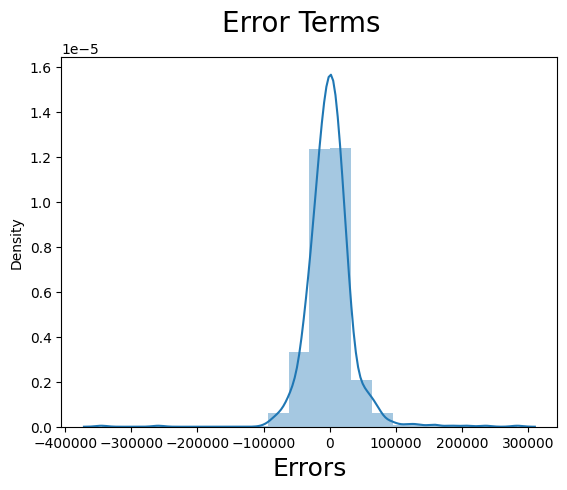

In [133]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_cnst), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

## Evaluate R2 of Train model

In [134]:
#evaluate model
r2 = r2_score(y_true = y_train,y_pred = y_train_cnst)
round(r2,3)

0.799

In [135]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_train - y_train_cnst))
print("RSS : ",rss)
mse = mean_squared_error(y_train, y_train_cnst)
print("MSE : ",mse)
rmse = mse**0.5
print("RMSE : ",rmse)

RSS :  1283308357943.2524
MSE :  1256913181.1393266
RMSE :  35452.971400706694


In [136]:
# Residual analysis
y_res = (y_train - y_train_cnst)
y_res

318     -47002.934243
239     -57226.432028
986     -51914.099360
1416    -26180.877706
390     -17889.003976
1005     28115.334734
568      68451.987829
342      49035.715319
114      20206.468060
499       3360.810121
365      21048.423591
308     -20974.127366
797      -8616.042823
703      -4020.023524
858     -39611.122103
25      -43519.455810
88       17276.751308
1129     55524.864547
1425    -19949.098018
728     -58803.410314
883     -12643.642904
606      14564.204733
1183     11992.563312
808      19271.850379
452      20024.697372
1395     17380.563971
1078     38037.938967
146       4314.453752
906     -26025.706963
614      13428.195292
405       4801.427770
45       13835.845751
1443    -19803.308755
1241    -15088.782758
537      19338.816712
454      34354.317938
160     -58141.022416
1433     -1119.224398
1037     34498.563419
106      -3238.853753
1307      4088.502943
876      27933.287011
771     -15004.186547
890      12752.336934
420      38602.828563
1446      

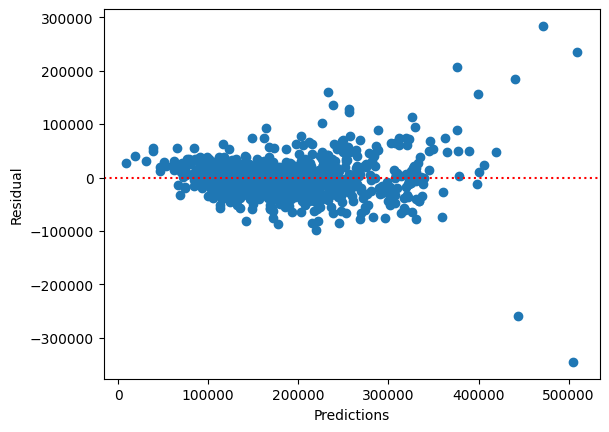

In [137]:
# Plotting scatter plot 
plt.scatter( y_train_cnst , y_res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.show()

## Prediction and Evalution on Test Data

In [138]:
#scale Test set
df_test[num_vars] = scaler.transform(df_test[num_vars])
df_test.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
1436,-0.433386,-0.144614,-1.496155,0.384025,-0.679020,-0.558025,-0.699764,-0.533302,-0.653302,0.665348,0.361022,-0.293313,-0.703973,-0.431488,-1.181447,-0.765928,-0.789230,-0.124502,-1.230557,-0.837450,-0.247791,-1.028080,-0.753316,0.175669,-0.234155,-0.776063,-0.937484,-0.927153,-0.985354,0.232304,0.306009,0.264038,-0.744598,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.469175,120500,-0.016404,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
57,0.880036,0.112107,0.648310,-0.532073,0.923321,-0.558025,1.051361,0.577925,-0.653302,-1.226909,-0.964030,-0.293313,0.660517,-0.440205,0.871757,-0.775986,1.186484,-0.124502,0.379709,-0.837450,-0.247791,0.784821,1.244440,0.175669,-0.234155,0.741868,0.308833,-0.927153,-0.985354,0.298247,0.306009,0.438477,-0.744598,0.347093,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,0.622834,196500,-1.137362,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
780,-0.297515,-0.253806,0.648310,-0.532073,0.534875,-0.355087,-0.699764,0.577925,-0.653302,-1.226909,-0.964030,-0.293313,1.501060,0.381373,-0.154845,0.212191,-0.789230,-0.124502,-0.498789,-0.837450,-0.247791,0.784821,-0.753316,0.175669,-0.234155,-0.776063,-0.314326,0.622148,0.658513,0.278464,0.306009,-0.329996,1.023633,-0.393502,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,

In [139]:
df_test.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.0,439.0,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000
mean,0.044381,0.008

In [140]:
#create y_test and X_test
y_test = df_test.pop('SalePrice')
X_test = df_test

In [141]:
#trained model columns
X_train_new.columns

Index(['OverallQual', '1stFlrSF', '2ndFlrSF', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_2.5Unf', 'Exterior1st_Stucco', 'Exterior2nd_ImStucc', 'Exterior2nd_VinylSd'], dtype='object')

In [142]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [143]:
#Running the Linear Model
test_lm = sm.OLS(y_test,X_test_new).fit()
#check summary()
test_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.824
Method:                 Least Squares   F-statistic:                     121.5
Date:                Mon, 24 Jul 2023   Prob (F-statistic):          2.49e-150
Time:                        21:07:32   Log-Likelihood:                -5190.6
No. Observations:                 439   AIC:                         1.042e+04
Df Residuals:                     421   BIC:                         1.049e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.668e+05   4674.099     35.694      0.000    1.58e+05    1.76e+05
OverallQual            3.13e+04   2659.761     11.768      0.000    2.61e+04    3.65e+04
1stFlrSF              3.167e+04   2531.384     12.512      0.000    2.67e+04    3.66e+04
2ndFlrSF              2.226e+04   2049.138     10.862      0.000    1.82e+04    2.63e+04
MSSubClass_90        -2.672e+04   1.09e+04     -2.444      0.015   -4.82e+04   -5228.939
MSSubClass_120       -1.985e+04   8052.371     -2.465      0.014   -3.57e+04   -4024.615
MSSubClass_160       -2.023e+04   9152.726     -2.210      0.028   -3.82e+04   -2237.518
MSZoning_RL           8332.9588   4797.619      1.737      0.083   -1097.312    1.78e+04
LotConfig_CulDSac     1.664e+04   6754.858      2.464      0.014    3366.221    2.99e+04
Neighborhood_Crawfor  1.356e+04   8182.248      1.657      0.098   -2525.415    2.96e+04
Neighborhood_NoRidge  3.784e+04    1.5e+04      2.521      0.012    8333.882    6.73e+04
Neighborhood_NridgHt  7.977e+04   9177.006      8.692      0.000    6.17e+04    9.78e+04
Neighborhood_Somerst  1.789e+04   8047.349      2.223      0.027    2068.751    3.37e+04
Neighborhood_StoneBr  9.345e+04   1.08e+04      8.674      0.000    7.23e+04    1.15e+05
Neighborhood_Veenker  1.083e-10    8.5e-11      1.273      0.204   -5.88e-11    2.75e-10
HouseStyle_2.5Unf    -4.634e+04   1.99e+04     -2.331      0.020   -8.54e+04   -7260.268
Exterior1st_Stucco   -4528.8266   1.53e+04     -0.296      0.768   -3.46e+04    2.56e+04
Exterior2nd_ImStucc   3.887e+04   2.55e+04      1.525      0.128   -1.12e+04     8.9e+04
Exterior2nd_VinylSd   5883.3958   3779.893      1.556      0.120   -1546.418    1.33e+04
==============================================================================
Omnibus:                       84.044   Durbin-Watson:                   1.819
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              607.944
Skew:                           0.587   Prob(JB):                    9.70e-133
Kurtosis:                       8.644   Cond. No.                     3.19e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 8.18e-33. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [144]:
# Making predictions
y_pred = lm.predict(X_test_new)

## Calculate r2 score of Test model

In [145]:
#evaluate model
r2 = r2_score(y_true = y_test,y_pred = y_pred)
round(r2,3)

0.801

In [146]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_test - y_pred))
print("RSS : ",rss)
mse = mean_squared_error(y_test, y_pred)
print("MSE :",mse)
rmse = mse**0.5
print("RMSE :",rmse)

RSS :  563430322698.6442
MSE : 1283440370.6119456
RMSE : 35825.136016656594


In [147]:
#drop the const
X_test_new = X_test_new.drop(['const'], axis=1)

In [148]:
#check final VIf of columns
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,OverallQual,2.40
6,MSZoning_RL,1.97
1,1stFlrSF,1.87
17,Exterior2nd_VinylSd,1.78
2,2ndFlrSF,1.57
10,Neighborhood_NridgHt,1.44
4,MSSubClass_120,1.31
11,Neighborhood_Somerst,1.29
9,Neighborhood_NoRidge,1.28
5,MSSubClass_160,1.27


Text(0, 0.5, 'y_pred')

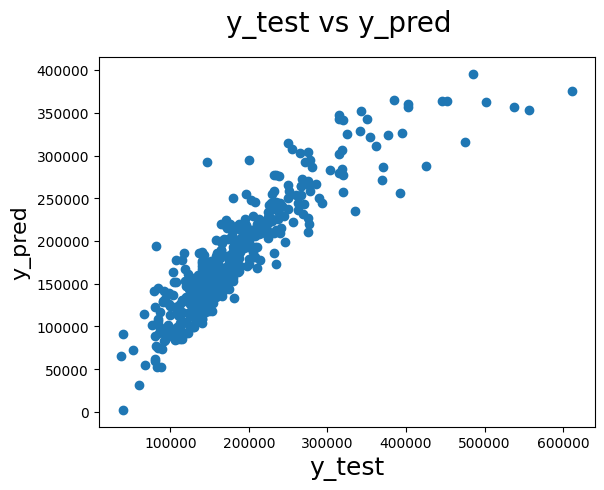

In [149]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label


In [150]:
X_train_new.columns

Index(['OverallQual', '1stFlrSF', '2ndFlrSF', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_2.5Unf', 'Exterior1st_Stucco', 'Exterior2nd_ImStucc', 'Exterior2nd_VinylSd'], dtype='object')

In [151]:
#final dataframe 
final_df = housing[['OverallQual', '1stFlrSF', '2ndFlrSF', 
                       'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 
                       'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 
                       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 
                       'Neighborhood_Somerst', 'Neighborhood_StoneBr', 
                       'Neighborhood_Veenker', 'HouseStyle_2.5Unf', 
                       'Exterior1st_Stucco', 'Exterior2nd_ImStucc', 'Exterior2nd_VinylSd']]
final_df.head()

,OverallQual,1stFlrSF,2ndFlrSF,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSZoning_RL,LotConfig_CulDSac,Neighborhood_Crawfor,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Veenker,HouseStyle_2.5Unf,Exterior1st_Stucco,Exterior2nd_ImStucc,Exterior2nd_VinylSd
0,7,856,854,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1,6,1262,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
2,7,920,866,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,7,961,756,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
4,8,1145,1053,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1


- No of Variables = 18 i.e. 
`OverallQual`, `1stFlrSF`, `2ndFlrSF`, 
`MSSubClass_90`, `MSSubClass_120`, `MSSubClass_160`, `MSZoning_RL`, `LotConfig_CulDSac`, `Neighborhood_Crawfor`, `Neighborhood_NoRidge`, `Neighborhood_NridgHt`, `Neighborhood_Somerst`, `Neighborhood_StoneBr`, `Neighborhood_Veenker`, `HouseStyle_2.5Unf`, `Exterior1st_Stucco`, `Exterior2nd_ImStucc`, `Exterior2nd_VinylSd`
- VIF < 5
- p-value < 0.05
- r2 score for Train Data set model = 0.799
- r2 score for Test Data set model = 0.801

In [152]:
y_pred_train = lm.predict(X_train_lm)
# y_pred_test = test_lm.predict(X_test_new)
y_pred_test = y_pred

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2score of train dataset :",r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2score of test dataset :",r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("Root mean sqaure of train dataset :",rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("Root mean square of test dataset :",rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE of train dataset :",mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE of train dataset :",mse_test_lr)
metric.append(mse_test_lr**0.5)

R2score of train dataset : 0.7989130032467827
R2score of test dataset : 0.8006068195788766
Root mean sqaure of train dataset : 1283308357943.2524
Root mean square of test dataset : 563430322698.6442
MSE of train dataset : 1256913181.1393266
MSE of train dataset : 1283440370.6119456


## Ridge Regression

In [153]:
# list of alphas to tune - if value too high it will lead to underfitting, 
#if it is too low, it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [154]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)


{'alpha': 6.0}


In [155]:
#Fitting Ridge model for alpha = 20 and printing coefficients which have been penalised
alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[ 32514.68327936  28660.193561    18048.04579144 -16388.25900891
  -7645.26415553 -17108.53863303  14414.2007587   14682.50779985
  17374.3997612   44575.8471298   42624.0669488   26560.91433826
  15882.14909548  20354.22506609 -12038.28135041 -16841.64870629
  13768.92257827  11412.94207585]


In [156]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2score train:",r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 score test:",r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS train :",rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS test :",rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE train :",mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE test :",mse_test_lr)
metric2.append(mse_test_lr**0.5)

R2score train: 0.7933674101478788
R2 score test: 0.7906958504177929
RSS train : 1318699537325.7246
RSS test : 591435997420.7778
MSE train : 1291576432.248506
MSE test : 1347234618.2705646


## Lasso Regression

In [157]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [158]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 100}


In [159]:
#Fitting Lasso model for alpha = 100 and printing coefficients which have been penalised

alpha =100

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=100)

In [160]:
lasso.coef_

array([ 30864.5193114 ,  28187.00015398,  17826.12473324, -17709.48023073,
        -9584.13586359, -21152.10016699,  14142.50585328,  14795.62946299,
        22291.43205282,  58833.39346883,  53485.87606689,  33499.64683649,
        26205.20379813,  32571.82853759, -12931.50912538, -18957.13656384,
        17802.20107155,  11241.34797859])

In [161]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 score train :",r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 score test :",r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("RSS train :",rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("RSS test :",rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE train :",mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE test :",mse_test_lr)
metric3.append(mse_test_lr**0.5)

R2 score train : 0.7975042334067624
R2 score test : 0.7951484159528448
RSS train : 1292298924908.3315
RSS test : 578854271050.0327
MSE train : 1265718829.4890614
MSE test : 1318574649.3167033


In [162]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),7.989130e-01,7.933674e-01,7.975042e-01
1,R2 Score (Test),8.006068e-01,7.906959e-01,7.951484e-01
2,RSS (Train),1.283308e+12,1.318700e+12,1.292299e+12
3,RSS (Test),5.634303e+11,5.914360e+11,5.788543e+11
4,MSE (Train),3.545297e+04,3.593851e+04,3.557694e+04
5,MSE (Test),3.582514e+04,3.670469e+04,3.631218e+04


## Lets observe the changes in the coefficients after regularization

In [163]:
betas = pd.DataFrame(index=X.columns)

In [164]:
betas.rows = X.columns

In [165]:
betas['Linear'] = lm.params
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [166]:
pd.set_option('display.max_rows', None)
betas.head(68)

,Linear,Ridge,Lasso
OverallQual,29860.149791,32514.683279,30864.519311
1stFlrSF,28032.409401,28660.193561,28187.000154
2ndFlrSF,18007.534337,18048.045791,17826.124733
MSSubClass_90,-20510.054611,-16388.259009,-17709.480231
MSSubClass_120,-14039.446459,-7645.264156,-9584.135864
MSSubClass_160,-25958.762938,-17108.538633,-21152.100167
MSZoning_RL,13345.662955,14414.200759,14142.505853
LotConfig_CulDSac,15825.294050,14682.507800,14795.629463
Neighborhood_Crawfor,27804.411492,17374.399761,22291.432053
Neighborhood_NoRidge,62546.144748,44575.847130,58833.393469


### Question 1
### What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

In [167]:
#earlier for Ridge alpha = 10 now take 20
alpha = 20
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print("Ridge Coefficients :",ridge.coef_)
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print("R2score train :",r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2score test :",r2_test_lr)

Ridge Coefficients : [ 33754.47665235  28865.65206371  18012.21614166 -13762.04127062
  -5376.12180181 -13090.52172171  14286.46814101  13310.64772975
  12697.10067508  35015.55438184  34297.49988033  20719.60665024
   9308.69993362  13084.41277162  -7992.3419133  -12995.78168288
   8784.49102395  11366.03992525]
R2score train : 0.7872982525032817
R2score test : 0.7851150904672894


- Coefficient values are increasing with increase in alpha.
- There is a drop in R2 score also of train and test ;
    - R2 score train : 0.7973 to 0.787
    - R2 score test : 0.790 to 0.785

In [168]:
#earlier for Lasso alpha = 100 now take 200
alpha =200

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 
print("Lasso Coefficients :",lasso.coef_)
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 score train :",r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 score test :",r2_test_lr)

Lasso Coefficients : [ 31870.35394047  28341.04476484  17646.78046718 -14910.21745006
  -5133.77854361 -16356.34429841  14927.9400212   13765.19051377
  16784.66137737  55115.89223876  48094.57577975  29445.70319557
  13110.38760453  20867.64813494     -0.         -13923.66284672
   3338.12732577  10704.48467021]
R2 score train : 0.7932967972550509
R2 score test : 0.7867741428595172


- As the value of alpha increases more features were removed from the model.
- There is a drop in R2 score also of train and test ;
    - R2 score train : 0.797 to 0.793
    - R2 score test : 0.795 to 0.786

### Question 3

### After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

 

- Top five features are `OverallQual`,`1stFlrSF`,`2ndFlrSF`,
  `MSSubClass_90`,`MSSubClass_120`

In [170]:
#Drop 5 features
X_train_new = X_train_new.drop(['OverallQual', '1stFlrSF',
                                '2ndFlrSF', 'MSSubClass_90',
                                'MSSubClass_120'], axis=1)

In [171]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 


Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [172]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 100}


In [173]:
#Fitting Lasso model for alpha = 500 and printing coefficients which have been penalised

alpha =500

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=500)

In [174]:
lasso.coef_

array([-19592.90293148,  33260.78944839,  24950.61774605,  46517.13329765,
       146124.19300678, 116594.45994078,  71073.15817556,  61765.03597914,
        27742.48772838,      0.        ,      0.        ,      0.        ,
        32222.81253679])

In [178]:
# Assuming we have already fitted the model 'lasso' on the training data

# Check if the columns in X_test_new match the columns in X_train_new
if set(X_test_new.columns) != set(X_train_new.columns):
    # If the columns do not match, find the mismatched columns
    missing_features = set(X_train_new.columns) - set(X_test_new.columns)
    print("Missing features in X_test_new:", missing_features)

# Reorder the columns in X_test_new to match the order in X_train_new
X_test_new = X_test_new[X_train_new.columns]

# Now, you can make predictions on the test dataset
#y_pred_test = lasso.predict(X_test_new)

Missing features in X_test_new: set()


In [179]:
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print("R2 train score :",r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("R2 test score :",r2_test_lr)

R2 train score : 0.4857886572960314
R2 test score : 0.3966319417750942


- After dropping the top 5 features of model r2 score is very low i.e. 48% for Train and 39% for Test

In [180]:
X_train_new.columns

Index(['MSSubClass_160', 'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'HouseStyle_2.5Unf', 'Exterior1st_Stucco', 'Exterior2nd_ImStucc', 'Exterior2nd_VinylSd'], dtype='object')

- Next top five features are : `MSSubClass_160`, `MSZoning_RL`, `LotConfig_CulDSac`, `Neighborhood_Crawfor`, `Neighborhood_NoRidge`
